In [1]:
install.packages("igraph")
library ("igraph")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




In [2]:
download.file("http://snap.stanford.edu/data/facebook_combined.txt.gz","/content/facebook_combined.txt")
unzip(zipfile="/content/facebook_combined.zip",exdir=".")

facebook_data <-read.table('/content/facebook_combined.txt')

Warning message in unzip(zipfile = "/content/facebook_combined.zip", exdir = "."):
“error 1 in extracting from zip file”


### Question 1 ###

Number of nodes: 4039 
Number of edges: 88234 
Is the Facebook network connected?: Yes 


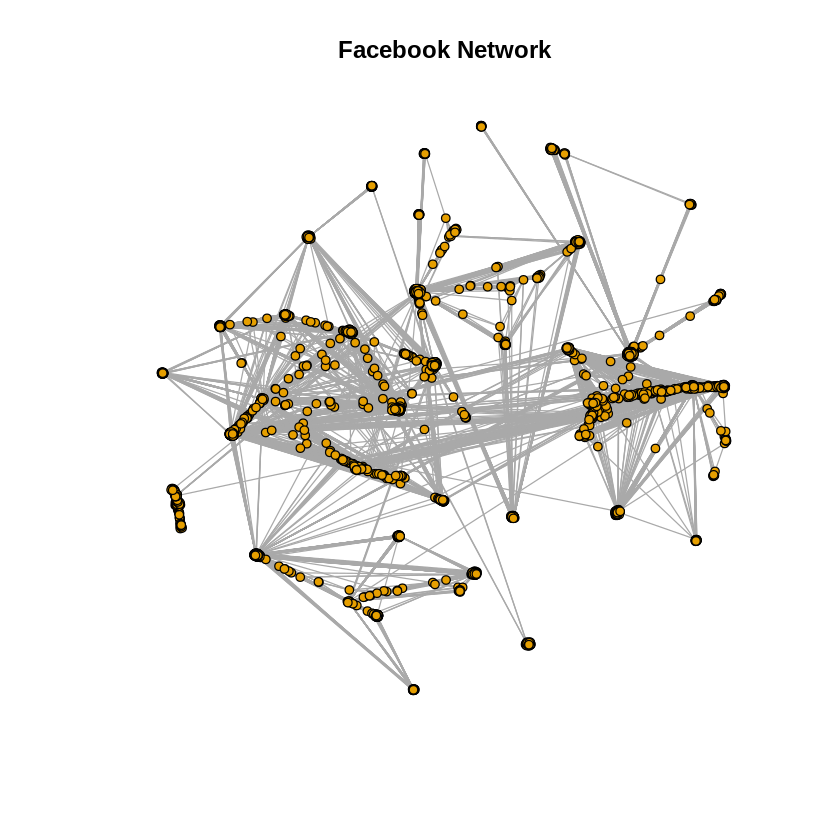

In [5]:
# Assigning data to a new variable
data_fb = facebook_data

# Incrementing every element in the matrix representation of the data
modified_matrix = as.matrix(data_fb) + 1

# Creating an undirected graph from the edge list
facebook_graph <- graph_from_edgelist(modified_matrix, directed = FALSE)

# Displaying the number of vertices and edges in the graph
cat("Number of nodes:", vcount(facebook_graph), "\n")
cat("Number of edges:", ecount(facebook_graph), "\n")

# Checking the connectivity of the network
network_status <- ifelse(is_connected(facebook_graph), "Yes", "No")
cat("Is the Facebook network connected?:", network_status, "\n")

# Plotting the graph
plot(facebook_graph, vertex.label = NA, vertex.size = 3, main = "Facebook Network")


Answer: The number of the nodes is 4039 and the edges is 88234. The Facebook network is connected.

### Question 2 ###

In [7]:
g = facebook_graph
print(sprintf("The diameter of the network: %d", diameter(g)))

[1] "The diameter of the network: 8"


### Question 3 ###

The average degree of the Facebook network: 43.69101 


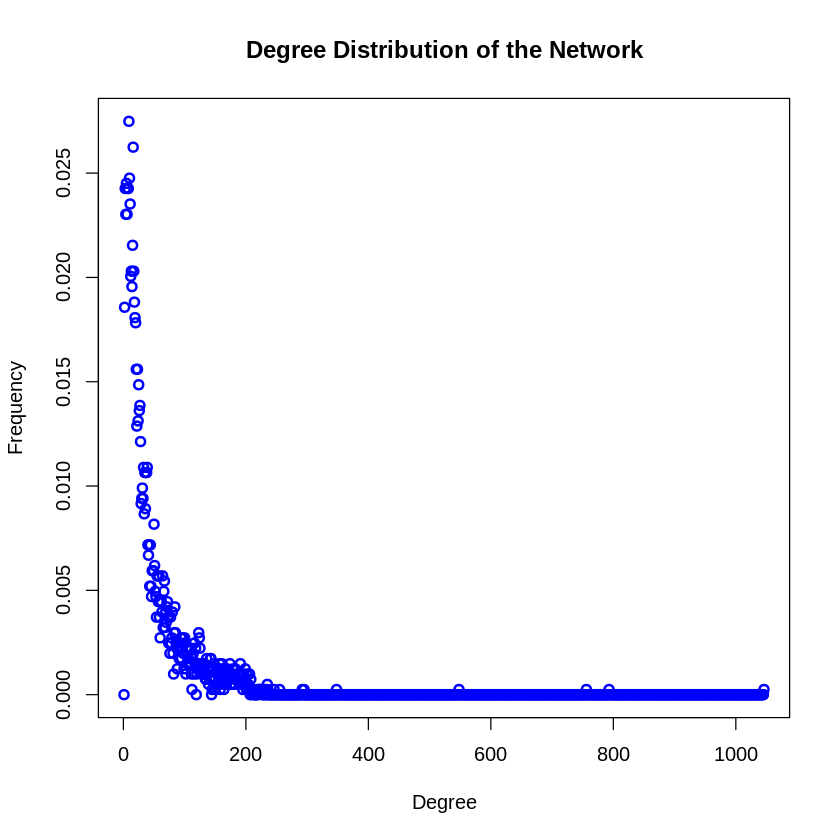

In [8]:
# Calculate the degree of each vertex in the graph
degrees_of_graph <- degree(facebook_graph)

# Output the average degree of the vertices
cat("The average degree of the Facebook network:", mean(degrees_of_graph), "\n")

# Plotting the degree distribution
plot(degree_distribution(facebook_graph),
     xlab = "Degree",
     ylab = "Frequency",
     main = "Degree Distribution of the Network",
     lwd = 2,           # This sets the line width to 2 for better visibility
     col = "blue")      # This changes the color of the bars to blue


### Question 4 ###


Call:
lm(formula = distribution_log_scale ~ degree_log_scale)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.4605 -0.3011  0.1542  0.3843  1.0310 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)      -0.66108    0.17441   -3.79 0.000193 ***
degree_log_scale -1.24753    0.03791  -32.90  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5481 on 225 degrees of freedom
Multiple R-squared:  0.8279,	Adjusted R-squared:  0.8272 
F-statistic:  1083 on 1 and 225 DF,  p-value: < 2.2e-16



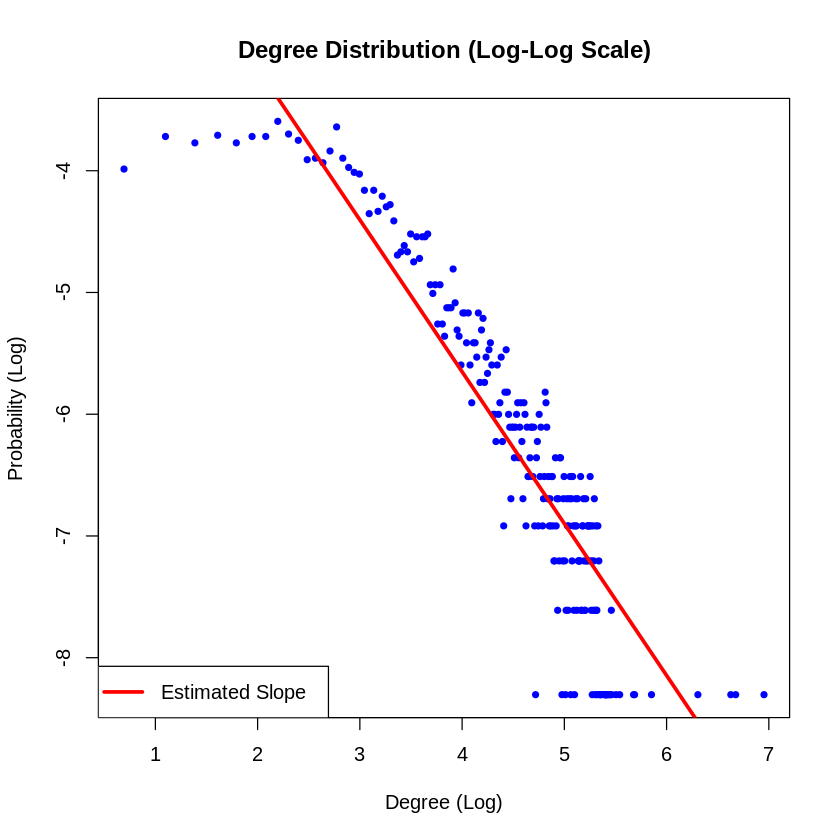

In [9]:
# Calculate the degree distribution for smaller networks
degree_dist <- degree_distribution(facebook_graph)
non_zero_indices <- which(degree_dist != 0)  # Find indices where distribution is non-zero

# Log-transform the degree and distribution values
degree_log_scale <- log(seq(along = degree_dist))[non_zero_indices]
distribution_log_scale <- log(degree_dist[non_zero_indices])

# Generate the log-log plot
plot(degree_log_scale, distribution_log_scale,
     main = "Degree Distribution (Log-Log Scale)",
     xlab = "Degree (Log)", ylab = "Probability (Log)",
     col = "blue", pch = 20)  # pch = 20 makes the plot points solid circles for better visibility

# Perform linear regression on the log-log scale data
linear_model <- lm(distribution_log_scale ~ degree_log_scale)
print(summary(linear_model))  # Printing model summary correctly

# Add regression line to the plot
abline(linear_model, col = "red", lwd = 3)

# Adding a legend to the plot
legend("bottomleft", legend = "Estimated Slope", col = "red", lwd = 3,
       lty = 1, pch = NA)  # pch = NA omits points inside the legend


### Question 5 ###

Number of nodes: 348 
Number of edges: 2866 


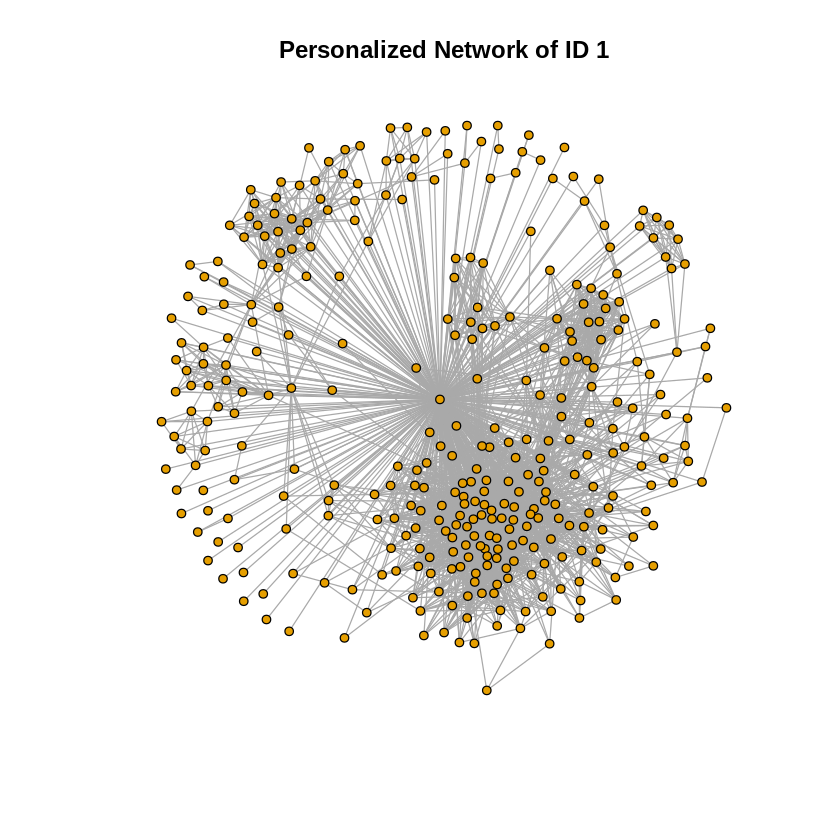

In [10]:
# Define the node ID for the ego graph
node_id <- 1

# Create an ego graph of order 1 from the main graph
ego_graph <- make_ego_graph(facebook_graph, order = 1, nodes = c(node_id))[[1]]

# Plotting the ego graph
plot(ego_graph, vertex.label = NA, vertex.size = 3,
     main = paste("Personalized Network of ID", node_id))

# Output the number of vertices and edges in the ego graph
cat("Number of nodes:", vcount(ego_graph), "\n")
cat("Number of edges:", ecount(ego_graph), "\n")


Answer: The personalized network has 348 nodes and 2866 edges

### Question 6 ###

In [11]:
print(diameter(ego_graph))

[1] 2


Answer: The diameter of the personalized network for ID 1 is 2. The simplest bounds for this diameter are set at 2 for the upper limit and 1 for the lower limit.

### Question 7 ###

If the diameter of the personalized network is 2, the upper bound identified in Question 6, this indicates that there exists at least one pair of nodes ($v_{i}$, $v_{j}$) that are indirectly connected. Specifically, they are linked through the central node $v_{c}$, which is at a distance of 1 from all nodes, resulting in a diameter of 2. In practical terms, this means that while person $v_{i}$ and person $v_{j}$ are not directly friends, they share a common friend in person
$v_{c}$. Conversely, if the diameter is 1, the lower bound from Question 6, all pairs of nodes are directly connected without intermediaries, which implies that everyone in this network is mutual friends with each other.

### Question 8 ###

In [12]:
# Calculate degrees for all nodes in the graph
node_degrees <- degree(facebook_graph)

# Identify nodes with degree greater than 200
high_degree_filter <- node_degrees > 200

# Isolate indices of high degree nodes
high_degree_nodes <- which(high_degree_filter)

# Calculate the number of high degree nodes
count_high_degree_nodes <- length(high_degree_nodes)

# Compute the average degree of these high degree nodes
average_degree_high_nodes <- mean(node_degrees[high_degree_nodes])

# Display the number of high degree nodes
cat("Number of the core nodes in the Facebook network:", count_high_degree_nodes, "\n")

# Display the average degree of high degree nodes
cat("The average degree of the core nodes:", average_degree_high_nodes, "\n")


Number of the core nodes in the Facebook network: 40 
The average degree of the core nodes: 279.375 


Answer: The Facebook network comprises 40 core nodes, with an average degree of approximately 279.

### Question 9 ###

Modularity with Fast-Greedy, Node ID: 1: 0.413
Modularity with Edge-Betweenness, Node ID: 1: 0.353
Modularity with Infomap, Node ID: 1: 0.394


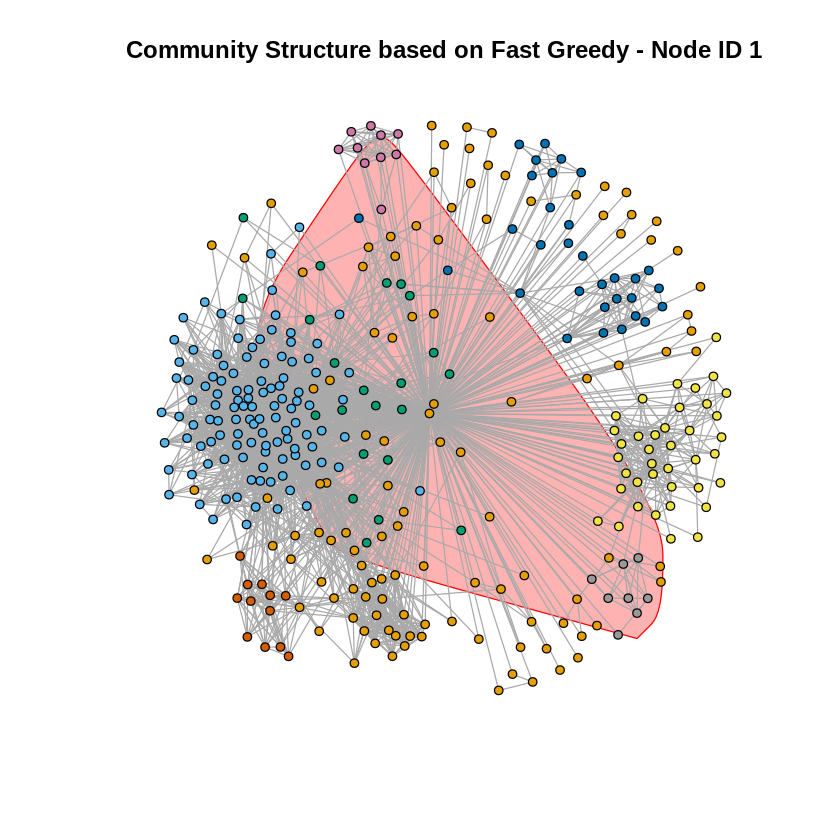

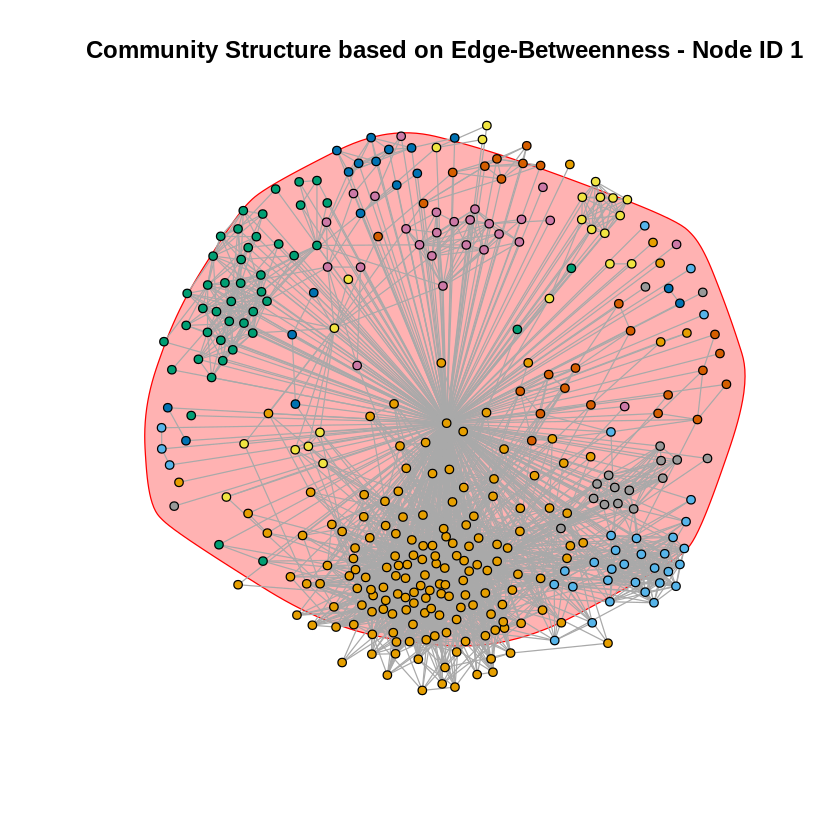

Modularity with Fast-Greedy, Node ID: 108: 0.436
Modularity with Edge-Betweenness, Node ID: 108: 0.507
Modularity with Infomap, Node ID: 108: 0.508


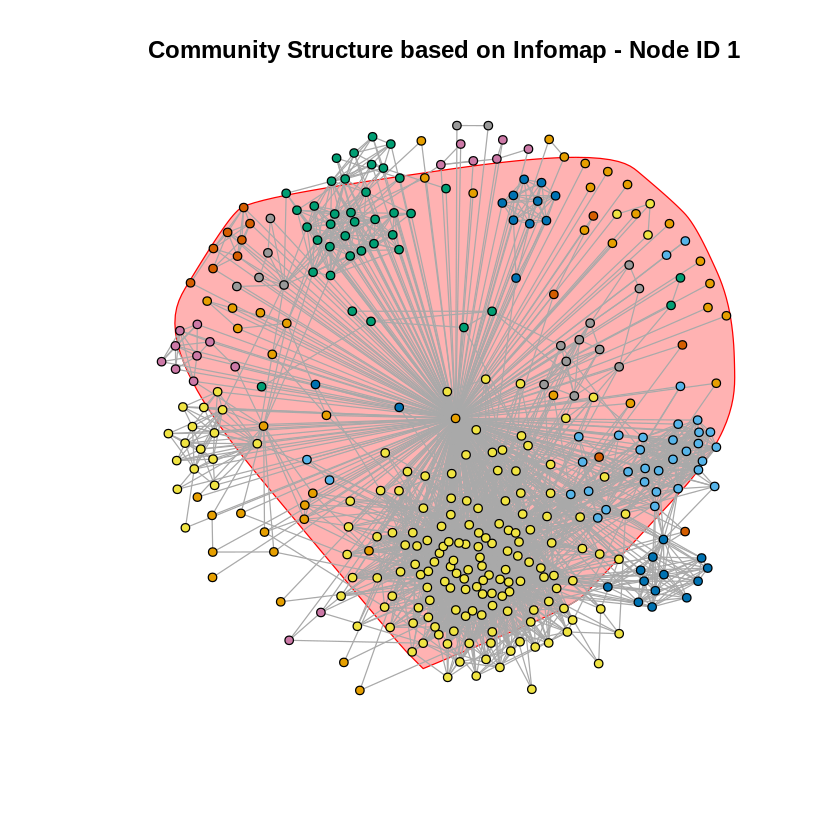

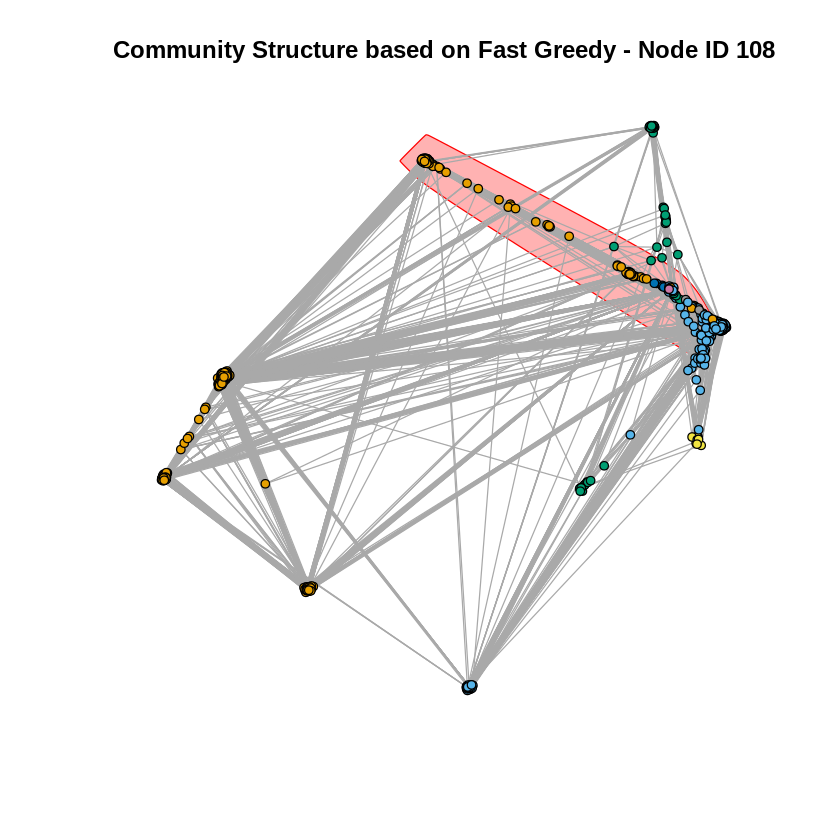

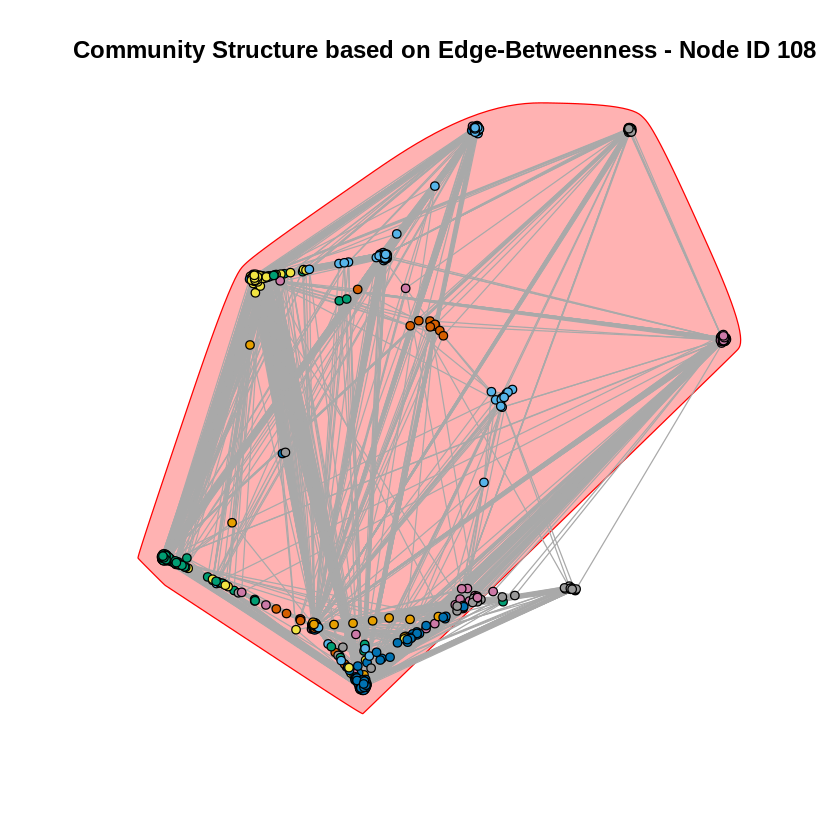

Modularity with Fast-Greedy, Node ID: 349: 0.252
Modularity with Edge-Betweenness, Node ID: 349: 0.134
Modularity with Infomap, Node ID: 349: 0.204


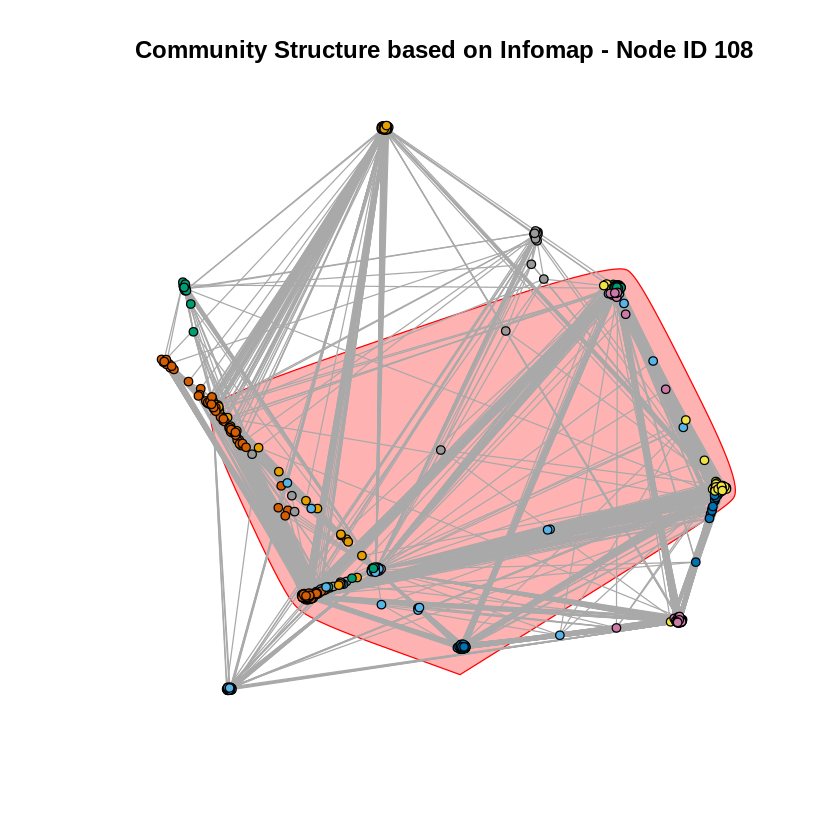

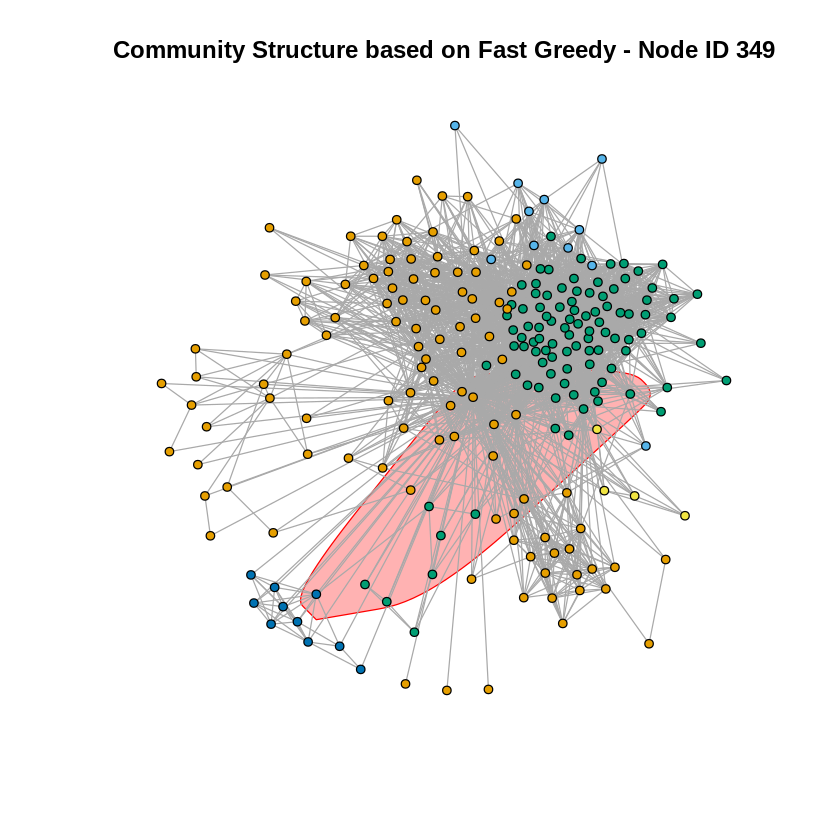

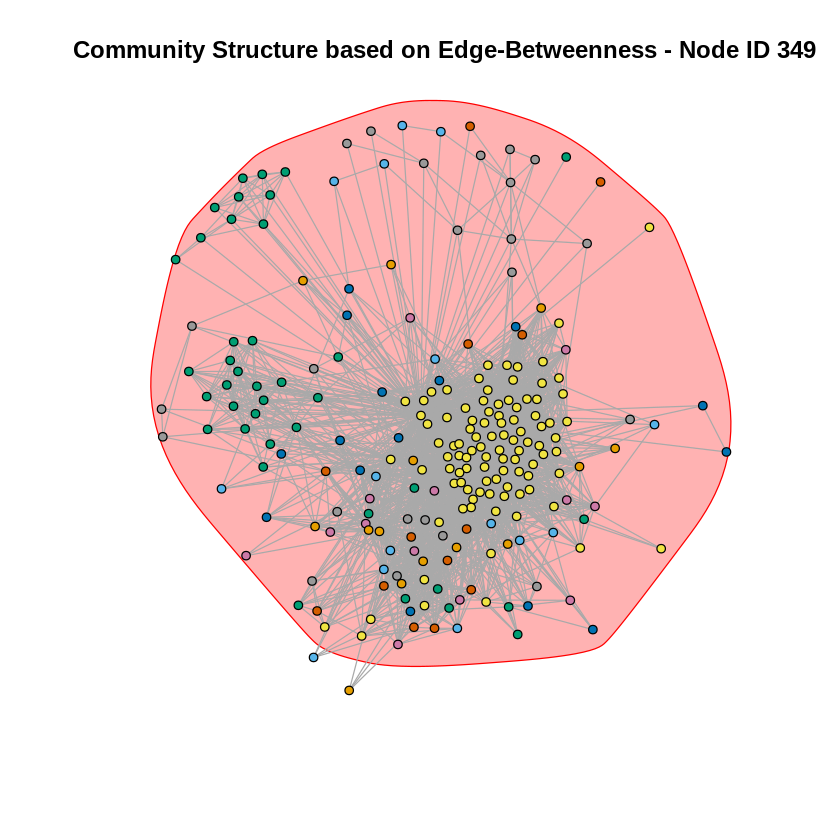

Modularity with Fast-Greedy, Node ID: 484: 0.507
Modularity with Edge-Betweenness, Node ID: 484: 0.489
Modularity with Infomap, Node ID: 484: 0.515


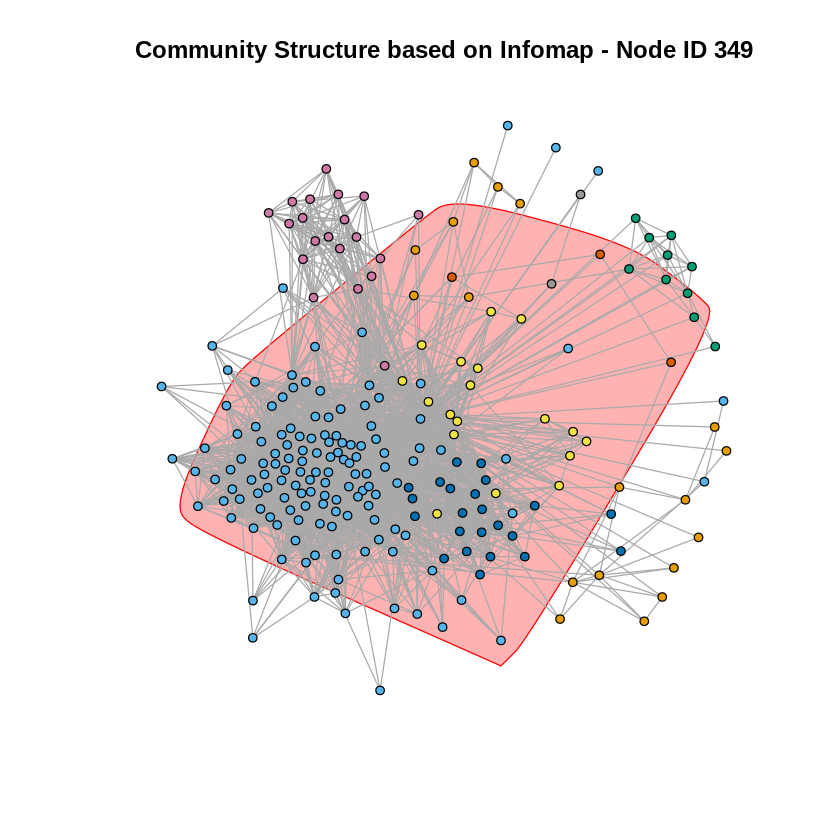

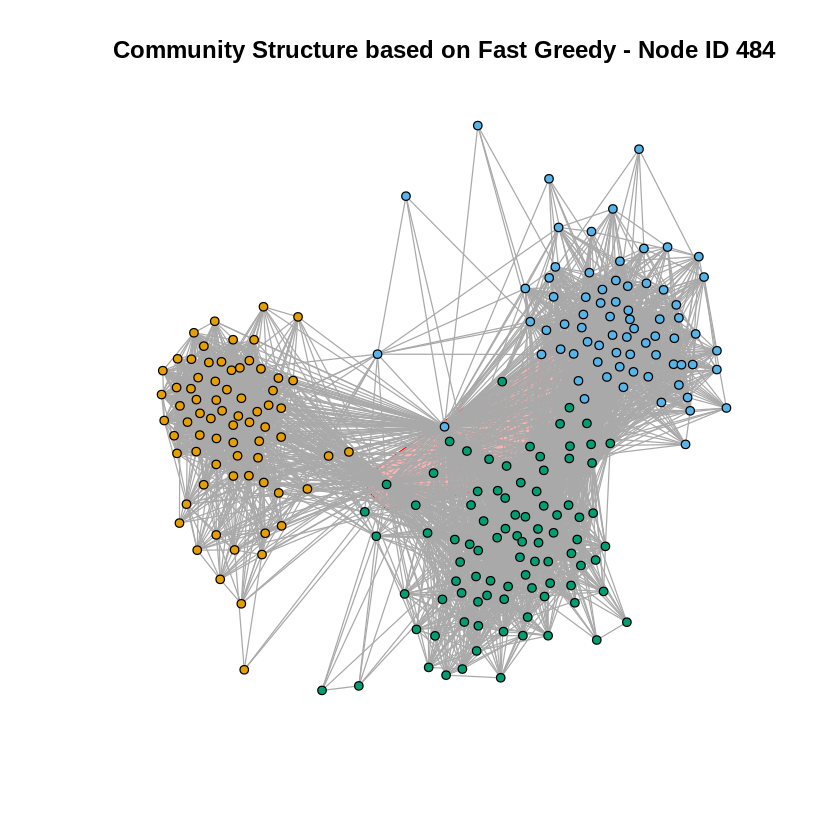

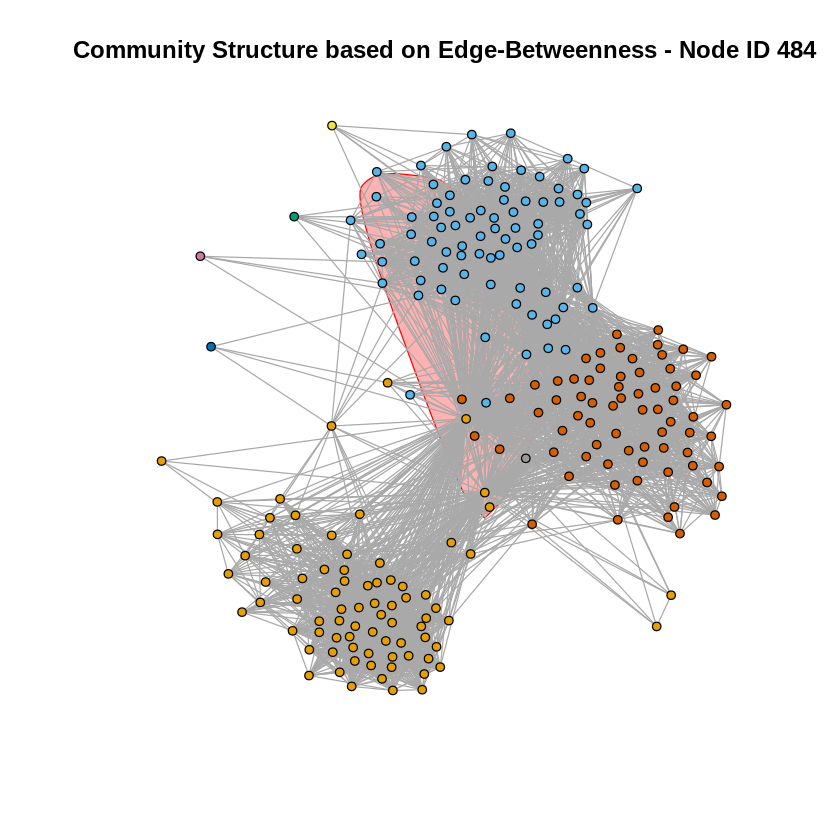

Modularity with Fast-Greedy, Node ID: 1087: 0.146
Modularity with Edge-Betweenness, Node ID: 1087: 0.028
Modularity with Infomap, Node ID: 1087: 0.027


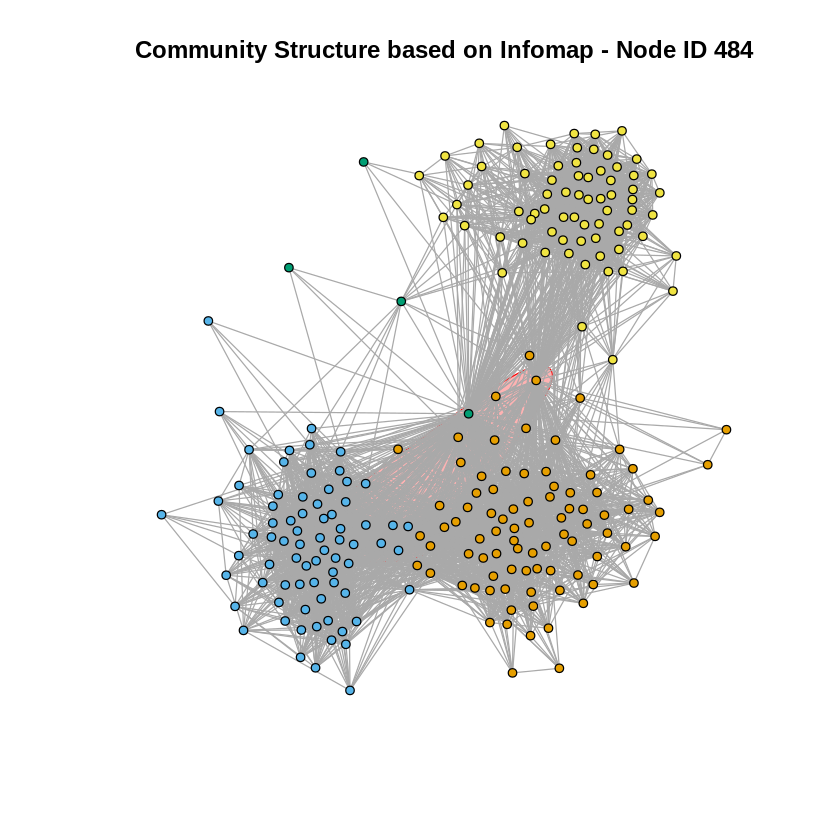

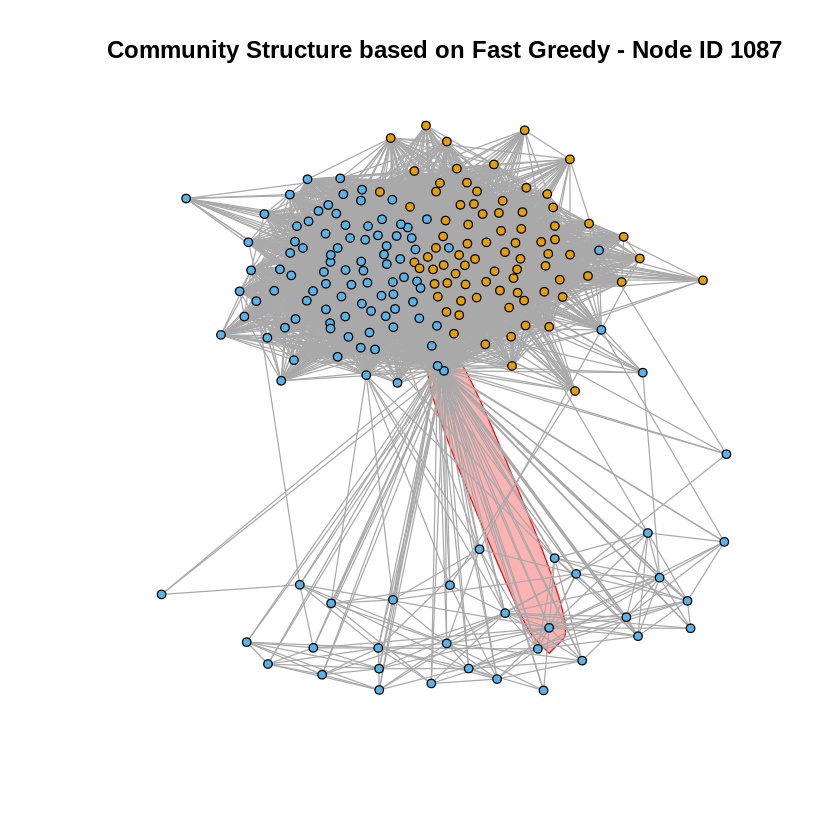

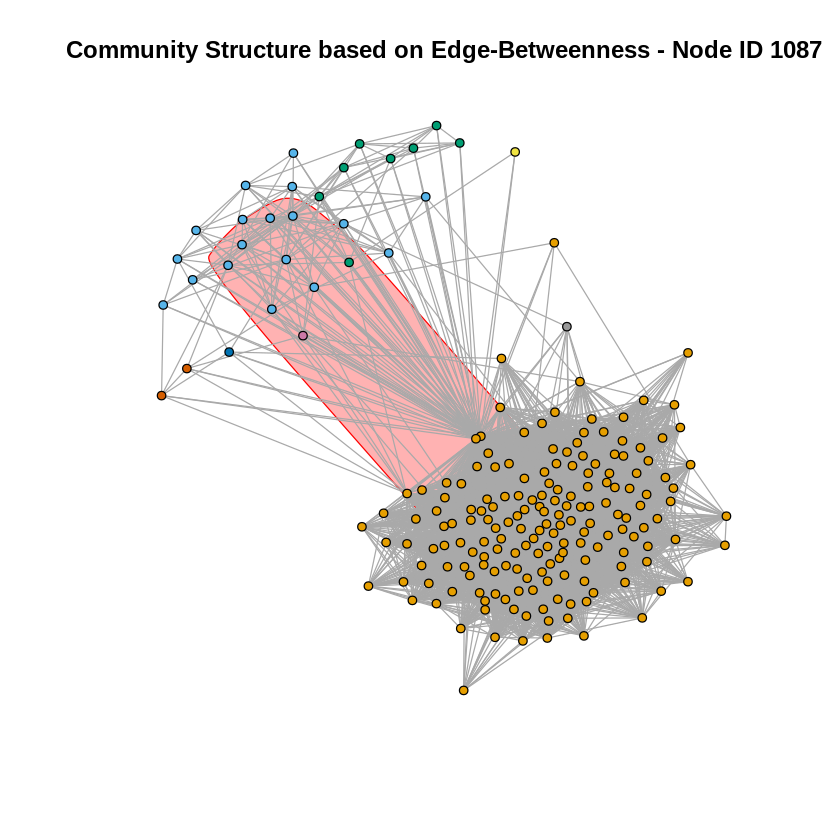

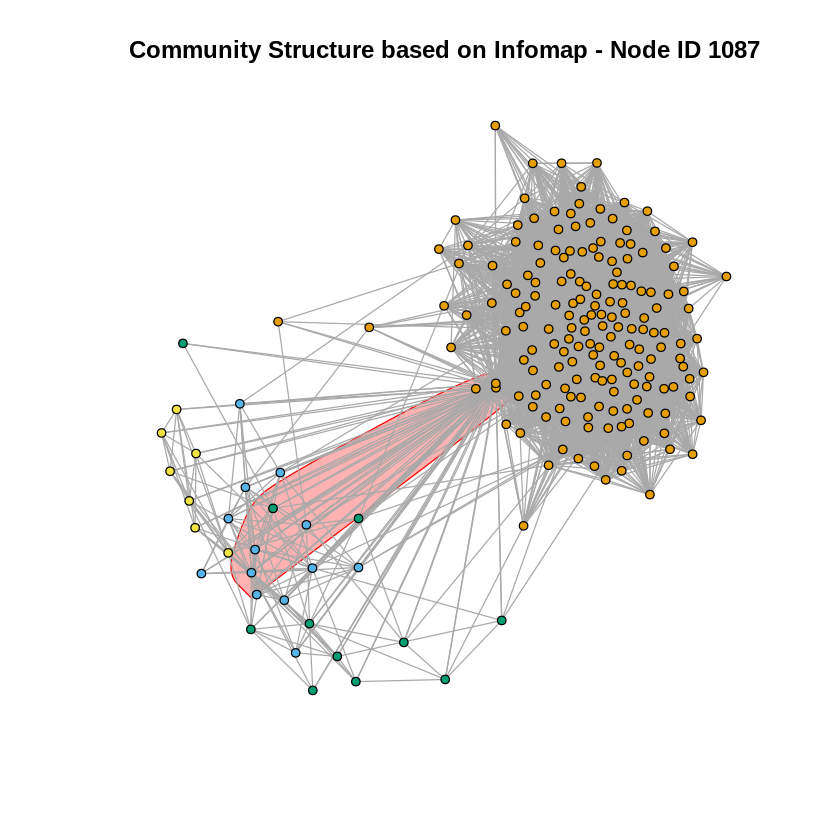

In [13]:
# Define node IDs to analyze
node_ids <- c(1, 108, 349, 484, 1087)

# Loop through each node ID
for (id in node_ids) {

  # Get the personalized network for the current node ID
  personalized_network <- make_ego_graph(facebook_graph, order=1, nodes=c(id))[[1]]

  # Find community structures using different algorithms
  community_fg <- cluster_fast_greedy(personalized_network)
  community_eb <- cluster_edge_betweenness(personalized_network)
  community_im <- cluster_infomap(personalized_network)

  # Calculate modularity for each community detection method
  modularity_fg <- modularity(community_fg)
  modularity_eb <- modularity(community_eb)
  modularity_im <- modularity(community_im)

  # Print modularity results
  cat(sprintf("Modularity with Fast-Greedy, Node ID: %d: %.3f\n", id, modularity_fg))
  cat(sprintf("Modularity with Edge-Betweenness, Node ID: %d: %.3f\n", id, modularity_eb))
  cat(sprintf("Modularity with Infomap, Node ID: %d: %.3f\n", id, modularity_im))

  # Plot community structures
  plot(personalized_network, mark.groups = community_fg$membership, vertex.size = 3,
       vertex.color = community_fg$membership, vertex.label = NA,
       main = sprintf("Community Structure based on Fast Greedy - Node ID %d", id))
  plot(personalized_network, mark.groups = community_eb$membership, vertex.size = 3,
       vertex.color = community_eb$membership, vertex.label = NA,
       main = sprintf("Community Structure based on Edge-Betweenness - Node ID %d", id))
  plot(personalized_network, mark.groups = community_im$membership, vertex.size = 3,
       vertex.color = community_im$membership, vertex.label = NA,
       main = sprintf("Community Structure based on Infomap - Node ID %d", id))
}


Answer: The community structures and modularity scores for each Node ID have been detailed above. Among these, the personalized network for Node ID 484 consistently shows the highest modularity scores, averaging around 0.50 across all community detection algorithms. This superior modularity is evident in the community structure plots for Node ID 484, where each group is relatively homogeneous and forms clearly defined clusters of high connectivity with minimal links between them. Conversely, the network for Node ID 1087 exhibits the lowest modularity scores, as reflected in its plots which display densely interconnected nodes across different groups. Notably, Node ID 484 achieves the highest modularity scores with the Fast-Greedy and Infomap methods, while Node ID 108 excels in the Edge-Betweenness algorithm.

### Question 10 ###

Modularity with Fast-Greedy, without Node ID: 1: 0.441853
Modularity with Edge-Betweenness, without Node ID: 1: 0.416146
Modularity with Infomap, without Node ID: 1: 0.418008
Modularity with Fast-Greedy, without Node ID: 108: 0.458127
Modularity with Edge-Betweenness, without Node ID: 108: 0.521322
Modularity with Infomap, without Node ID: 108: 0.520546


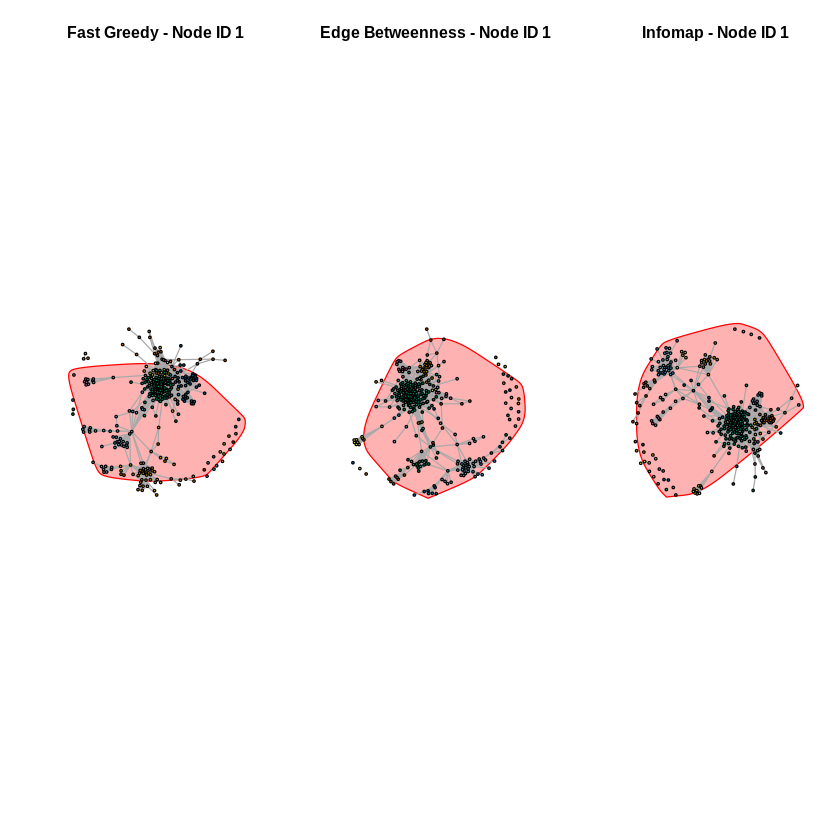

Modularity with Fast-Greedy, without Node ID: 349: 0.245692
Modularity with Edge-Betweenness, without Node ID: 349: 0.150566
Modularity with Infomap, without Node ID: 349: 0.244816


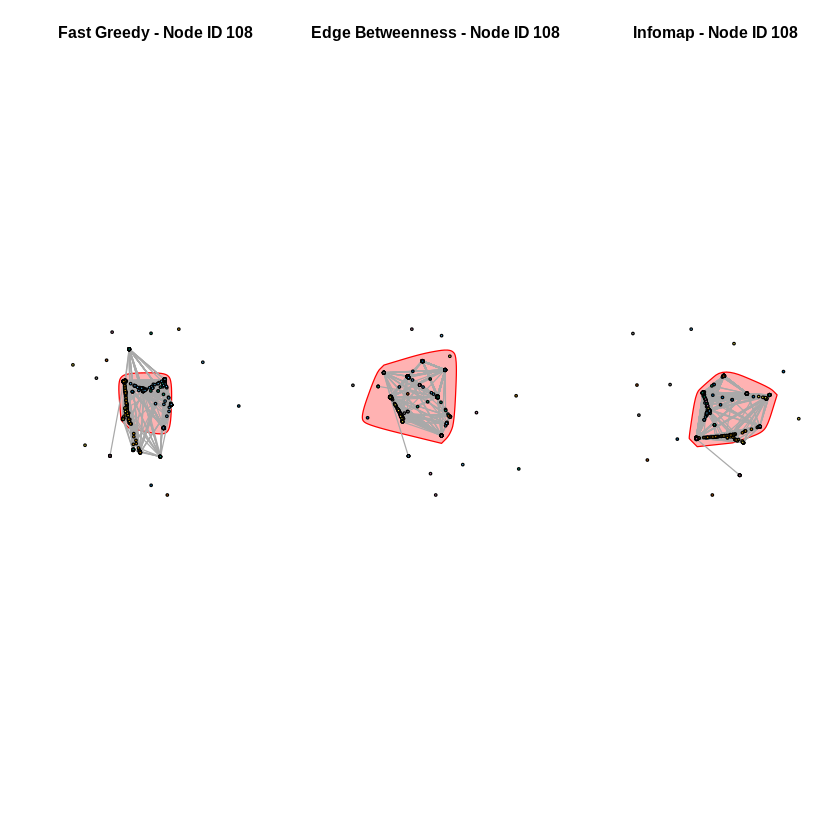

Modularity with Fast-Greedy, without Node ID: 484: 0.534214
Modularity with Edge-Betweenness, without Node ID: 484: 0.515441
Modularity with Infomap, without Node ID: 484: 0.543444


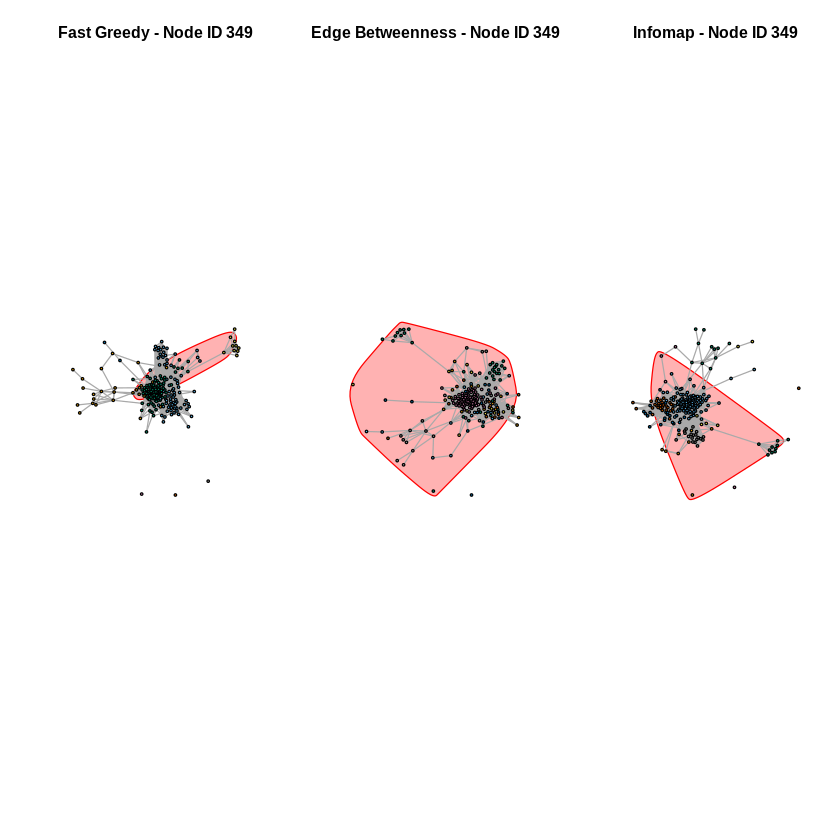

Modularity with Fast-Greedy, without Node ID: 1087: 0.148196
Modularity with Edge-Betweenness, without Node ID: 1087: 0.032495
Modularity with Infomap, without Node ID: 1087: 0.027372


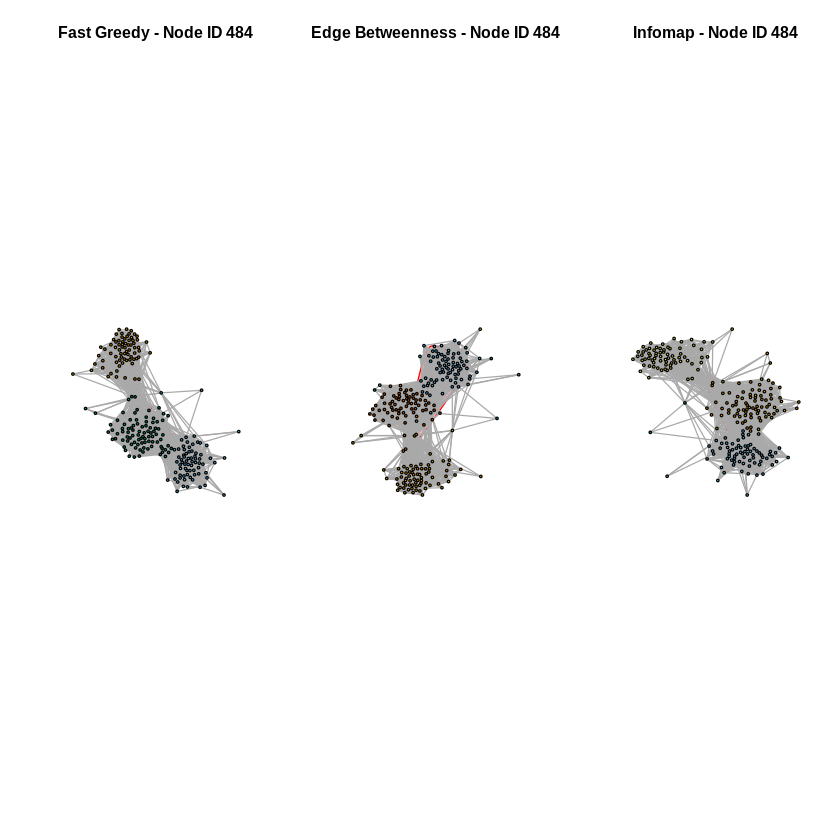

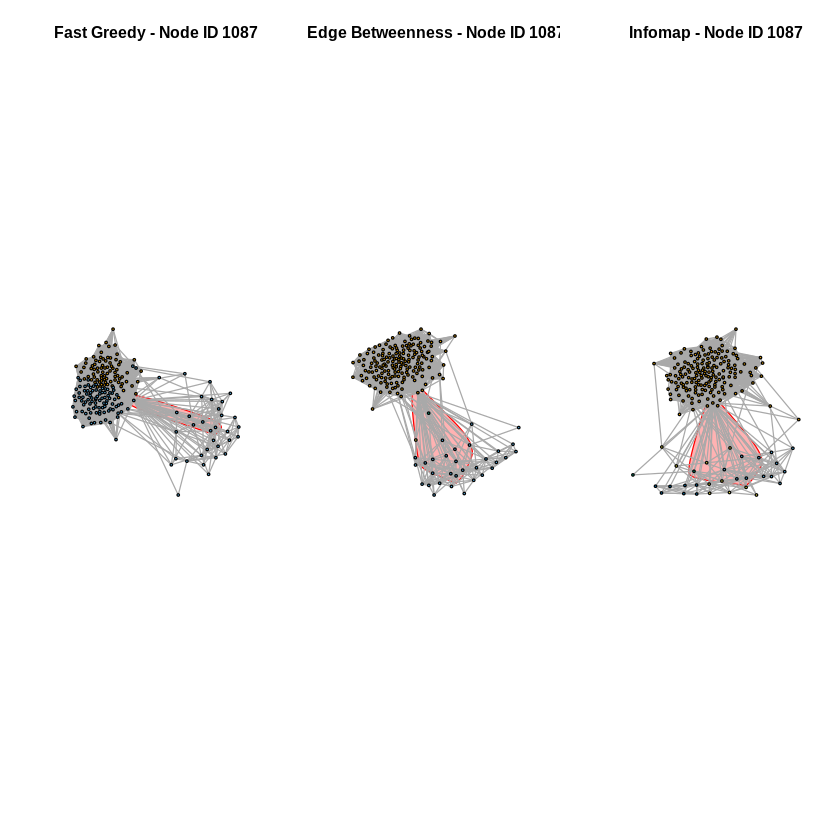

In [14]:
# Function to analyze community structure and modularity of a node's ego network
analyze_community_structure <- function(graph, node_id) {
  # Get the ego network for the node, excluding the node itself
  g_noid <- induced_subgraph(graph, neighbors(graph, node_id))

  # Find community structures using various algorithms
  fgc <- cluster_fast_greedy(g_noid)
  ebc <- cluster_edge_betweenness(g_noid)
  imc <- cluster_infomap(g_noid)

  # Calculate and print modularity for each community detection method
  cat(sprintf("Modularity with Fast-Greedy, without Node ID: %d: %f\n", node_id, modularity(fgc)))
  cat(sprintf("Modularity with Edge-Betweenness, without Node ID: %d: %f\n", node_id, modularity(ebc)))
  cat(sprintf("Modularity with Infomap, without Node ID: %d: %f\n", node_id, modularity(imc)))

  # Plot community structures
  par(mfrow=c(1,3))  # setting layout to plot all three graphs side by side
  plot(g_noid, mark.groups=fgc$membership, vertex.size=3, vertex.color=fgc$membership, vertex.label=NA,
       main=sprintf("Fast Greedy - Node ID %d", node_id))
  plot(g_noid, mark.groups=ebc$membership, vertex.size=3, vertex.color=ebc$membership, vertex.label=NA,
       main=sprintf("Edge Betweenness - Node ID %d", node_id))
  plot(g_noid, mark.groups=imc$membership, vertex.size=3, vertex.color=imc$membership, vertex.label=NA,
       main=sprintf("Infomap - Node ID %d", node_id))
  par(mfrow=c(1,1))  # resetting layout to default
}

# Node IDs to analyze
node_ids <- c(1, 108, 349, 484, 1087)

# Apply the function to each node ID
for (id in node_ids) {
  analyze_community_structure(g, id)
}


Answer: The outcomes for the community structures and modularity scores across each Node ID have been delineated previously. These findings echo the patterns noted in Q9. Predominantly, the personalized network of Node ID 484 attains the highest modularity scores using the Fast-Greedy and Infomap algorithms, whereas Node ID 108 excels with the Edge-Betweenness algorithm. Conversely, the network corresponding to Node ID 1087 consistently shows the lowest modularity scores across all methods. Notably, a comparison between the results in Q9 and Q10 reveals an increase in modularity scores upon the exclusion of the core node from all five personalized networks. This enhancement stems from the core node's role in interlinking all other nodes, which complicates the division of the network into communities characterized by dense intra-community ties and minimal inter-community links. Consequently, networks devoid of the core node generally report higher modularity scores.

### Question 11 ###

Answer: According to the project guidelines, the embeddedness of a node is defined by the number of mutual friends it shares with the core node. In the context of the personalized network, where each node is a neighbor of the core node at a distance of one, a node's embeddedness is determined by the count of its neighboring nodes, excluding the core node itself. Therefore, the embeddedness of a node $v_{i}$ with respect to the core node $v_{core}$ can be mathematically represented as:
$$
\text{embed}(v_{i}, v_{core}) = \text{degree}(v_{i}) - 1
$$
where
degree ($v_{i}$) is the total number of direct connections
$v_{i}$ has, including the core node.

### Question 12 ###

Warning message:
“`graph.data.frame()` was deprecated in igraph 2.0.0.
ℹ Please use `graph_from_data_frame()` instead.”
Warning message:
“`induced.subgraph()` was deprecated in igraph 2.0.0.
ℹ Please use `induced_subgraph()` instead.”
Warning message:
“`delete.vertices()` was deprecated in igraph 2.0.0.
ℹ Please use `delete_vertices()` instead.”


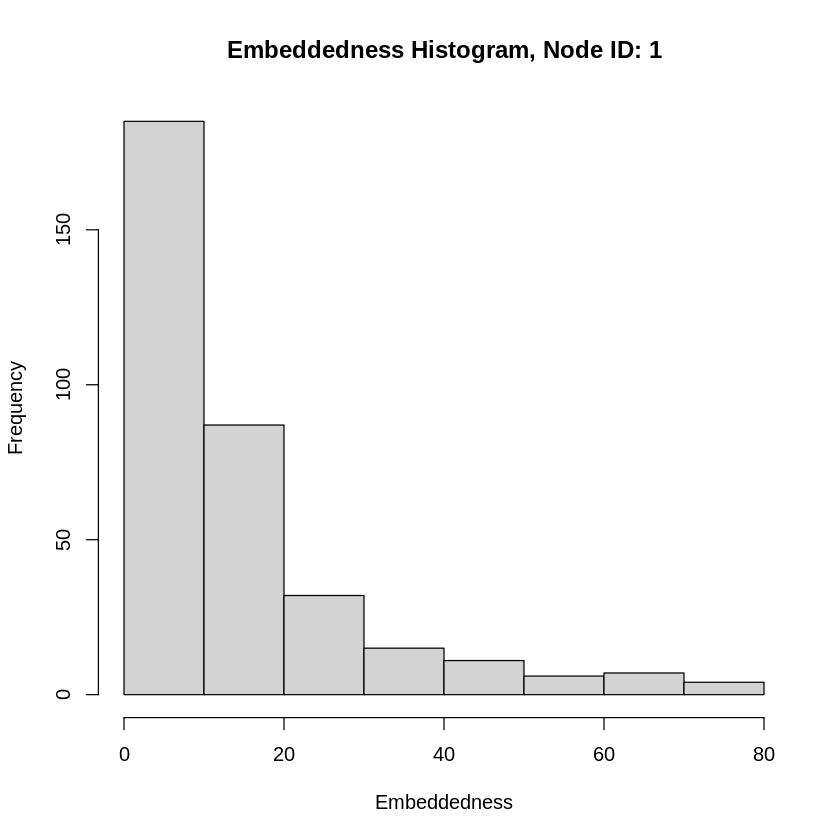

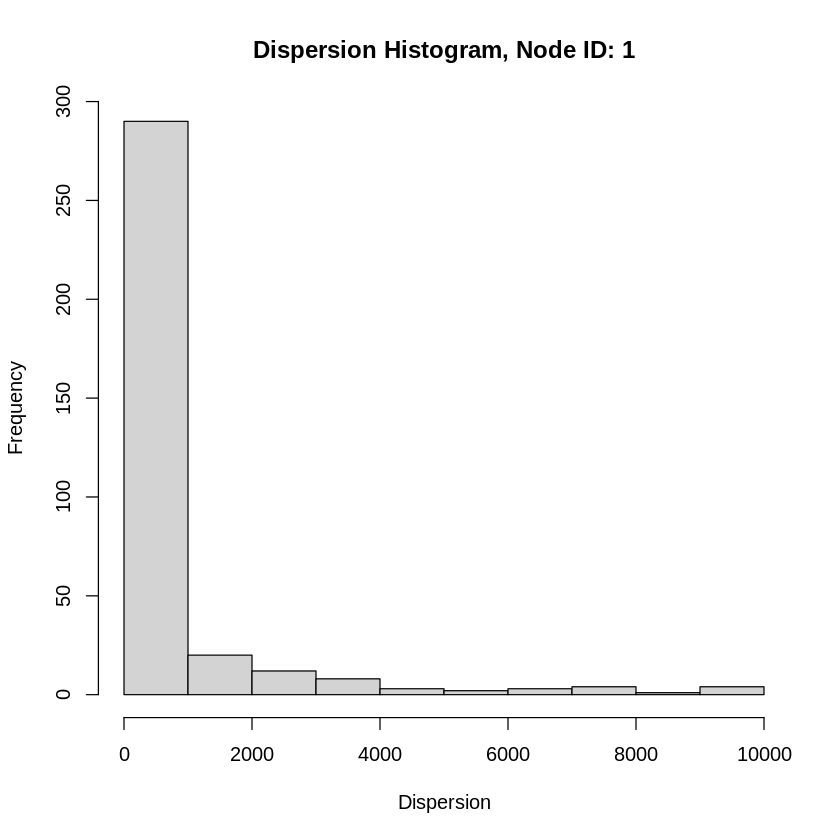

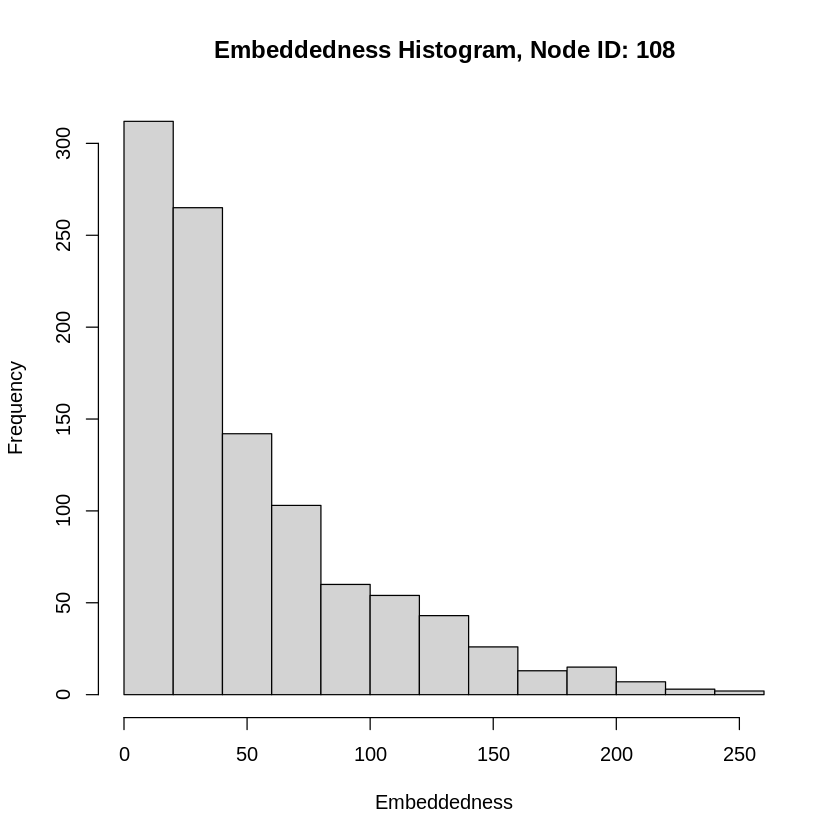

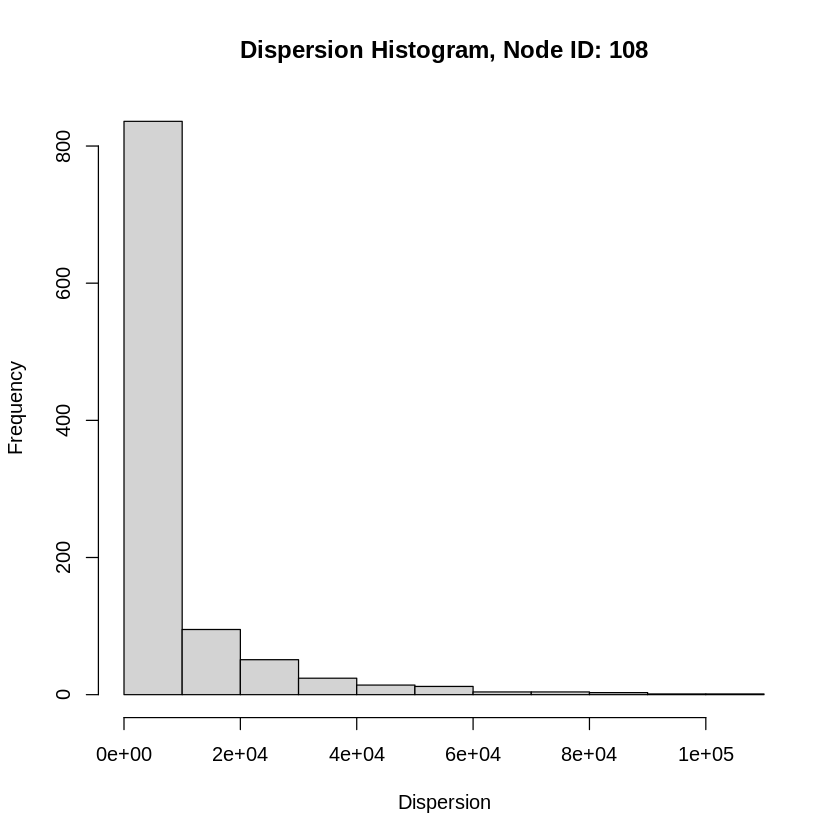

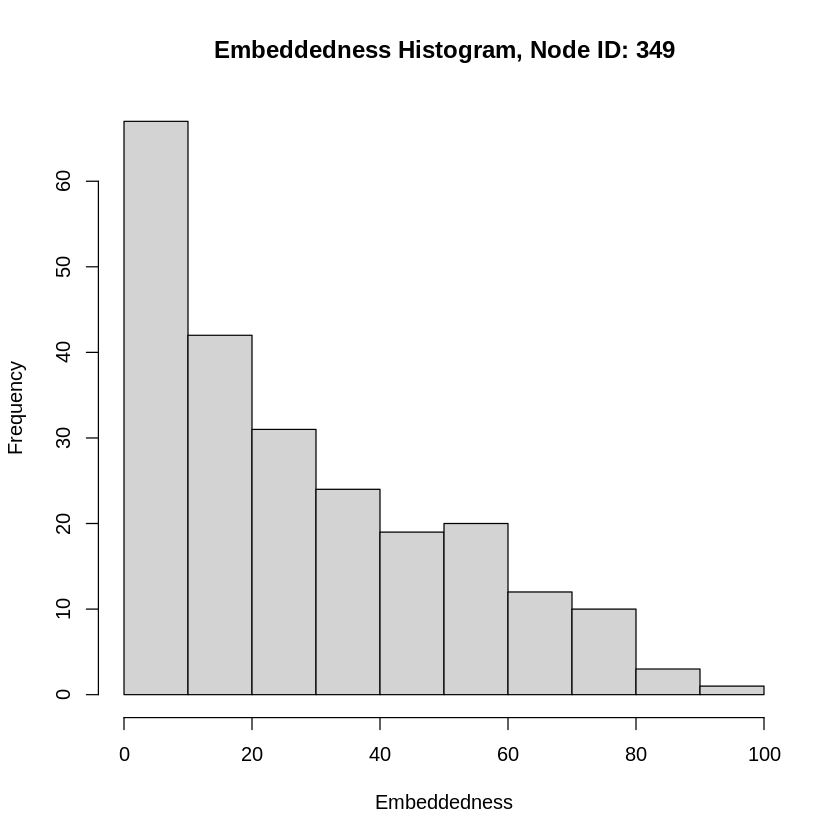

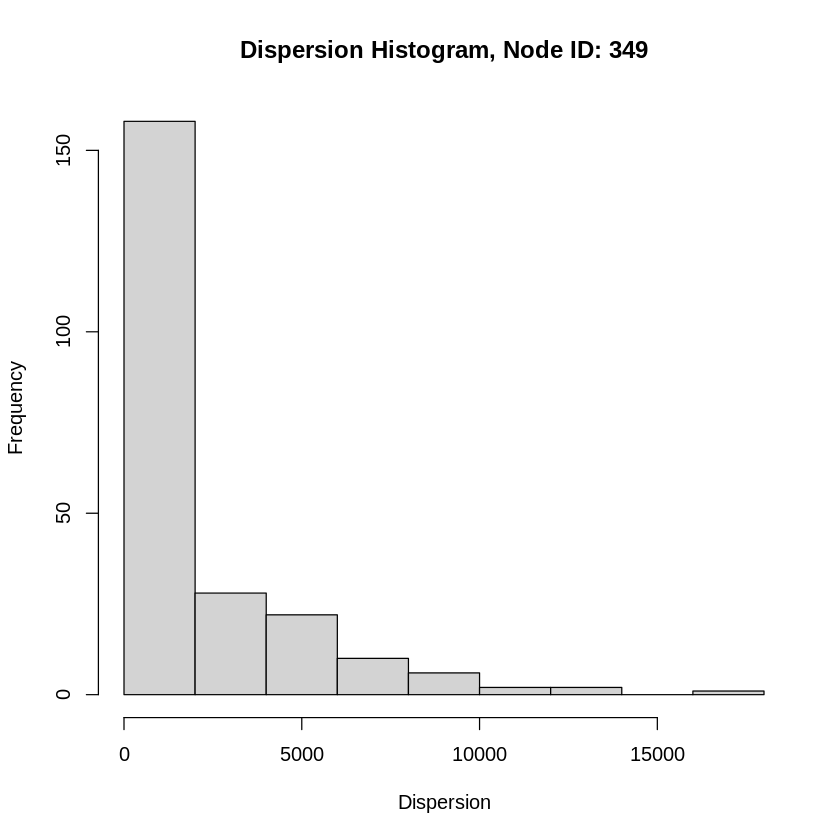

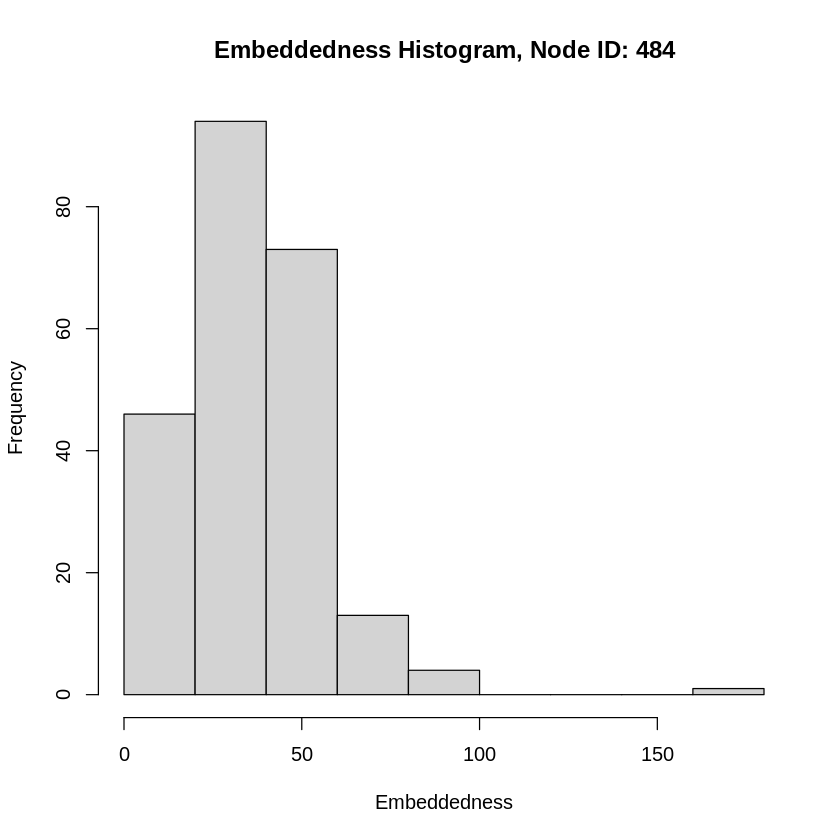

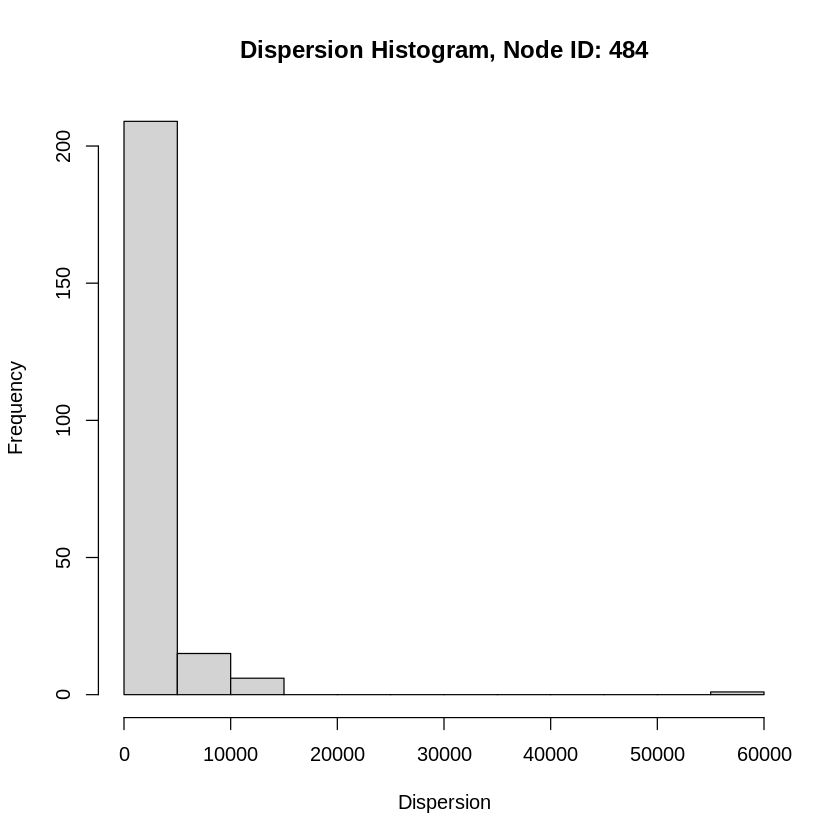

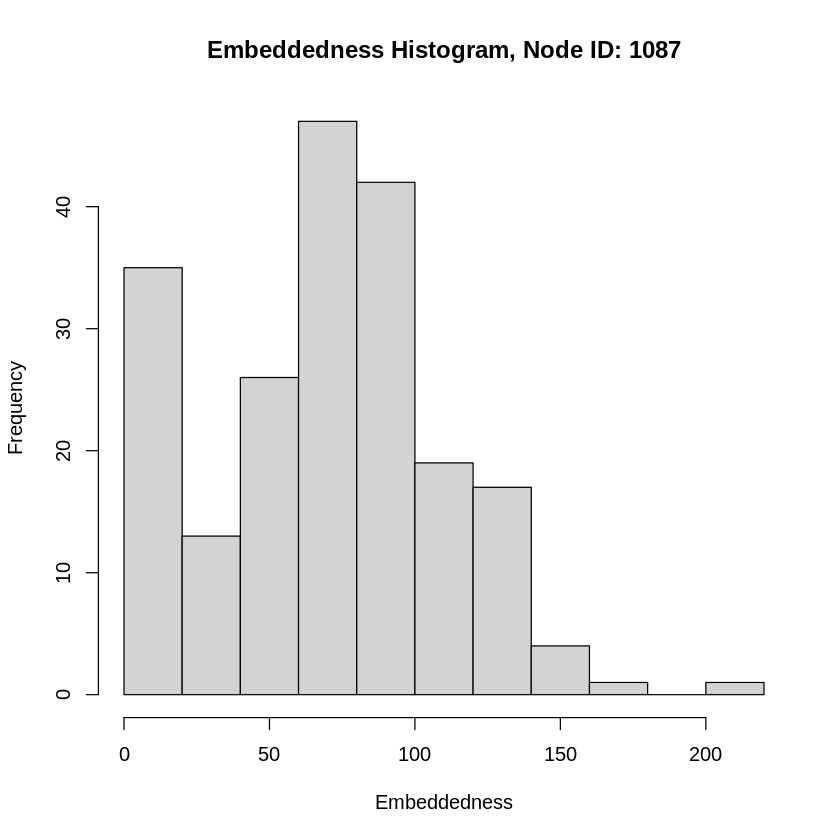

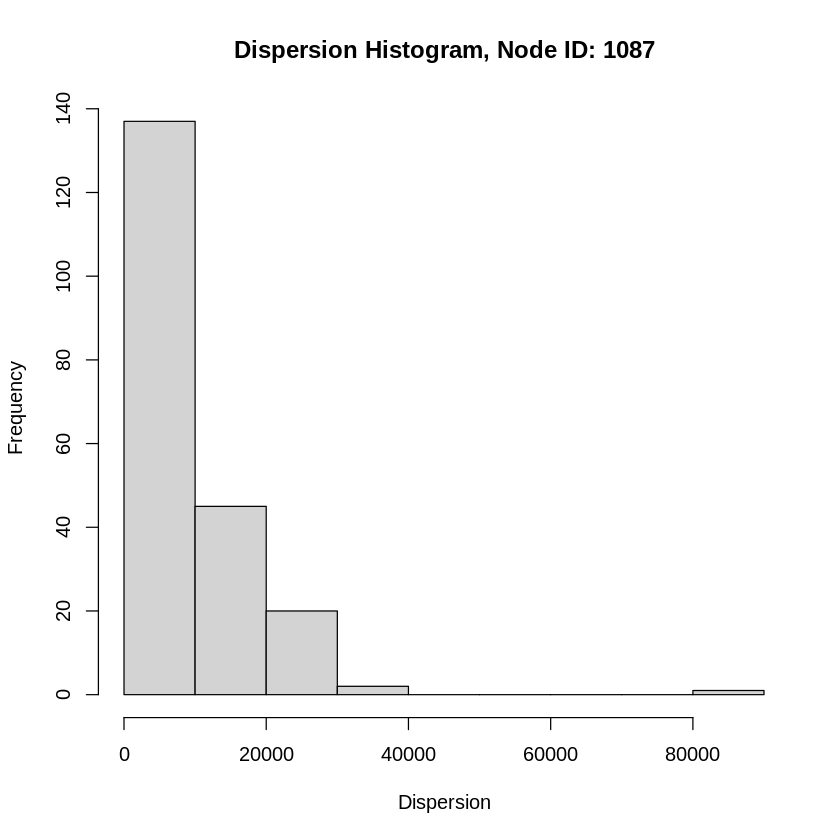

In [5]:
# Function to compute embeddedness and dispersion
compute_metrics <- function(g, core_id) {
  # Get personalized network
  neighbor_nodes <- unlist(ego(g, order=1, nodes=core_id))
  g_core <- induced.subgraph(g, neighbor_nodes)
  g_core$name <- sort(neighbor_nodes)

  # Initialize vectors
  embeds <- numeric()
  disp <- numeric()

  # Iterate through neighboring nodes
  for (v in vertex_attr(g_core)$name) {
    if (v == core_id) next

    # Embeddedness calculation
    core_neighbors <- neighbors(g_core, core_id)
    target_neighbors <- neighbors(g_core, v)
    inter <- intersection(core_neighbors, target_neighbors)
    embeds <- c(embeds, length(inter))

    # Dispersion calculation
    g_modified <- delete.vertices(g_core, c(core_id, v))
    if (embeds[length(embeds)] > 1) {
      inter_ver <- as.character(inter$name)
      vtoids <- which(vertex_attr(g_modified)$name %in% inter_ver)

      # Get sum of distances
      disp_mat <- distances(g_modified, v = vtoids, to = vtoids)
      disp_mat[disp_mat == Inf] <- diameter(g_modified) + 1
      disp <- c(disp, sum(disp_mat))
    } else {
      disp <- c(disp, 0)
    }
  }

  return(list(embeds = embeds, disp = disp))
}

# Function to plot histograms
plot_histogram <- function(embeds, disp, core_id) {
  hist(embeds, xlab = "Embeddedness", ylab = "Frequency",
       main = sprintf("Embeddedness Histogram, Node ID: %d", core_id))
  hist(disp, xlab = "Dispersion", ylab = "Frequency",
       main = sprintf("Dispersion Histogram, Node ID: %d", core_id))
}

# Main execution block
fb_txt <- read.table('/content/facebook_combined.txt', header = FALSE)
g <- graph_from_data_frame(fb_txt, directed = FALSE)

node_ids <- c(1, 108, 349, 484, 1087)

for (core_id in node_ids - 1) {  # Adjust node_ids for 0-based indexing
  metrics <- compute_metrics(g, as.character(core_id))
  plot_histogram(metrics$embeds, metrics$disp, core_id + 1)  # Convert back to 1-based indexing for plotting
}


### Question 13&14 ###

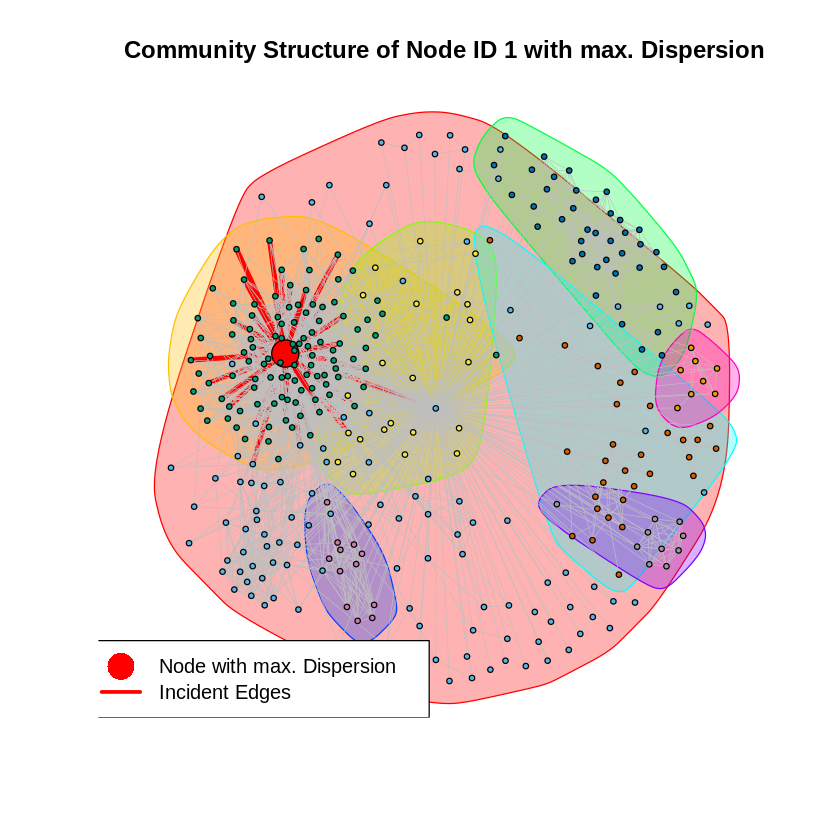

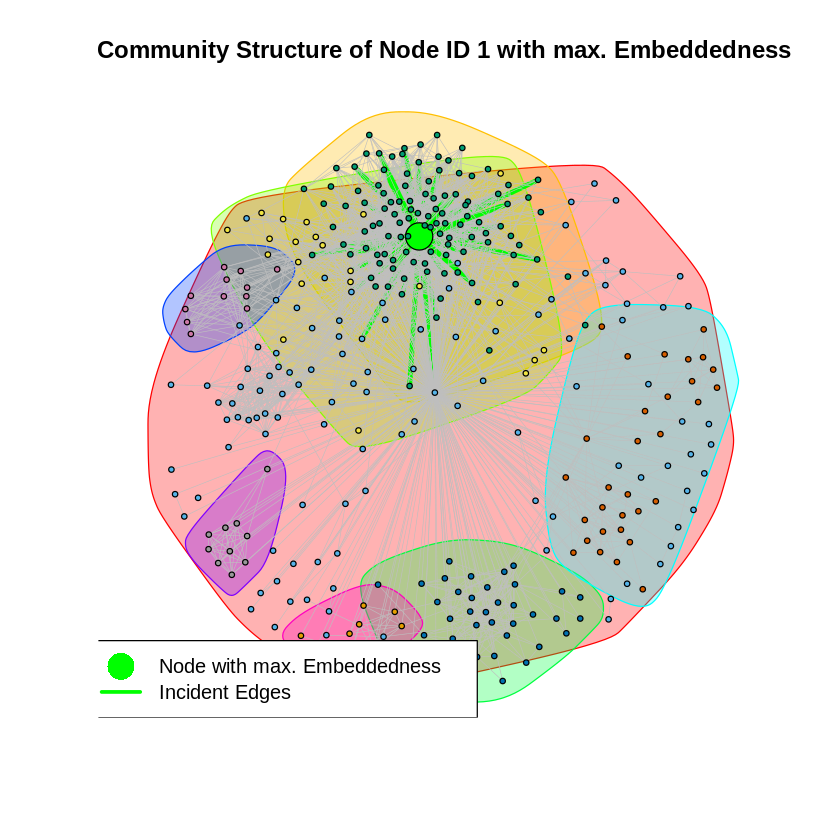

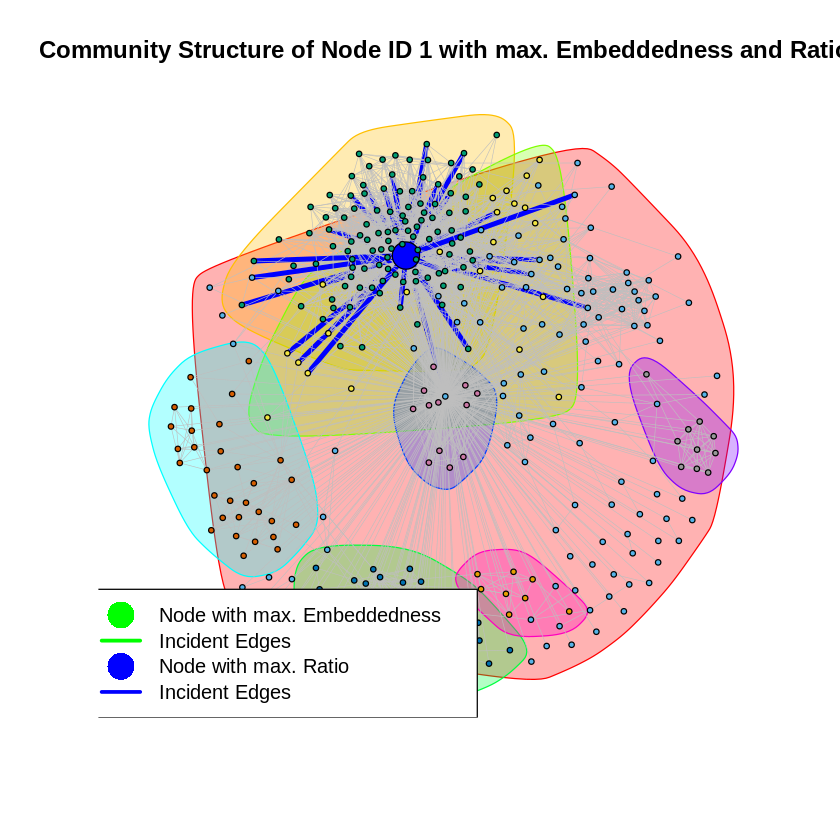

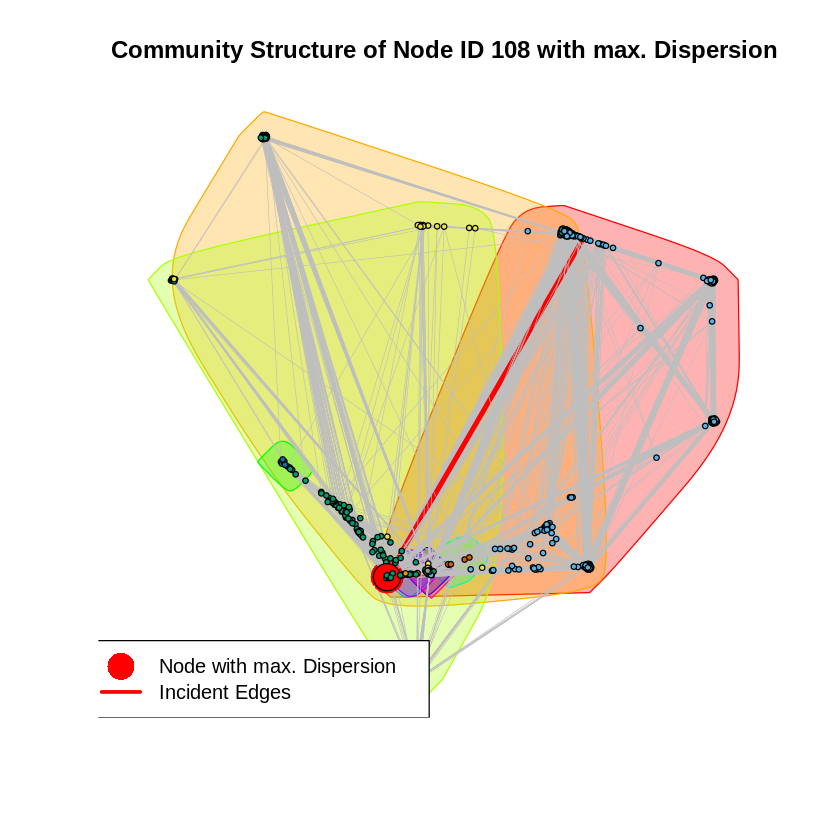

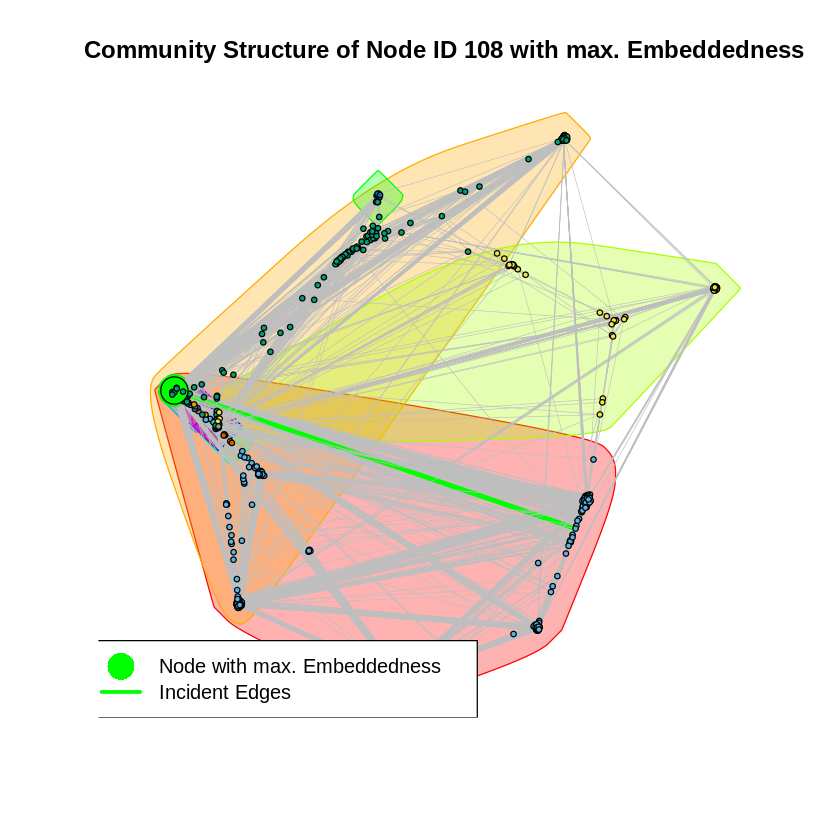

...

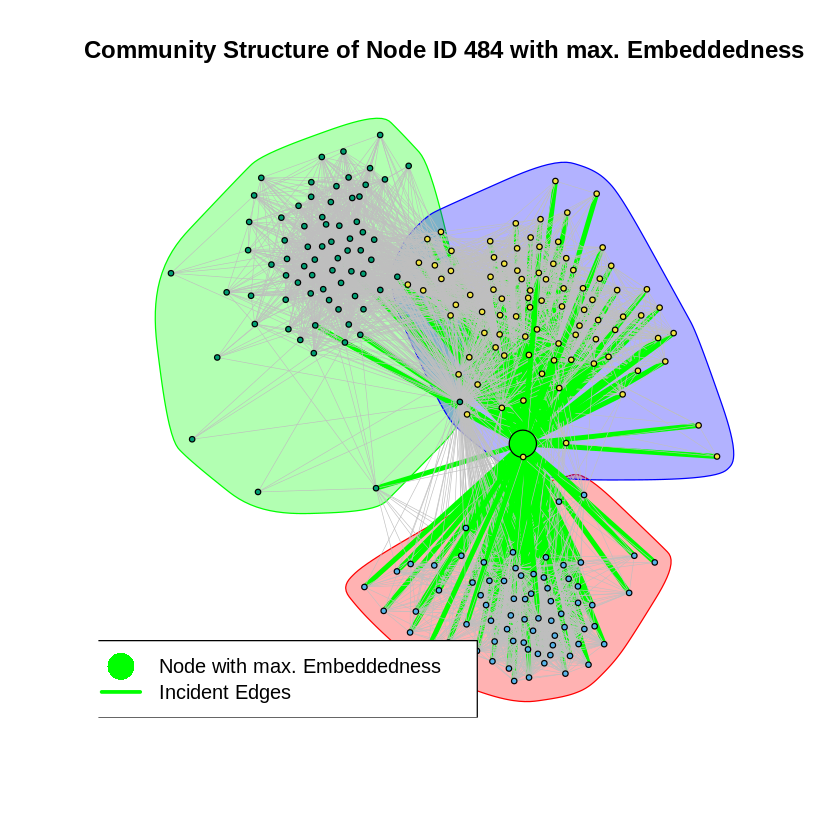

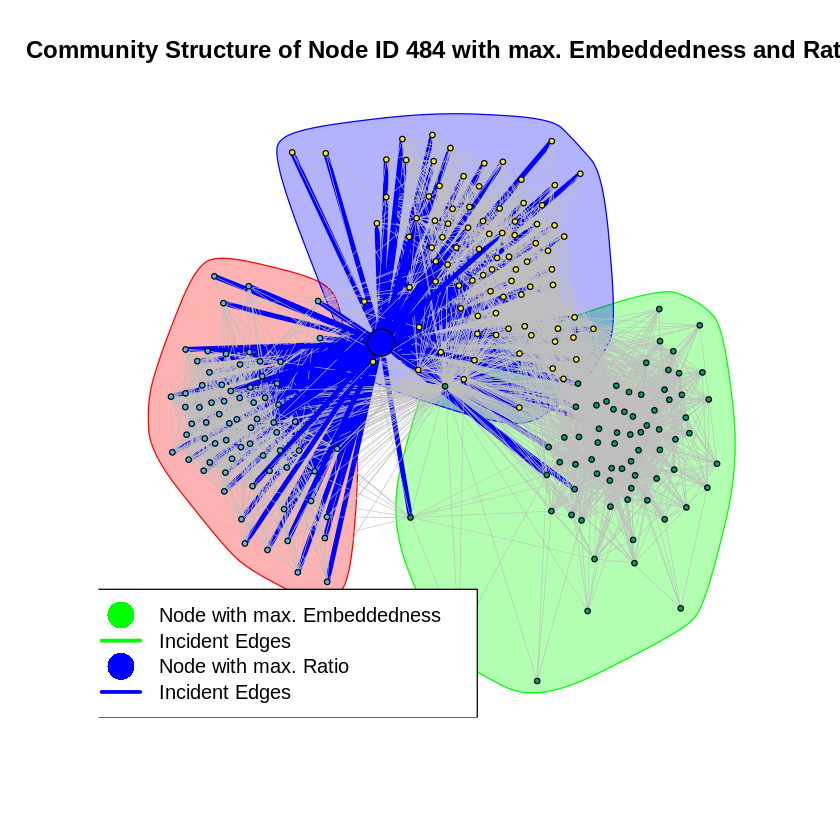

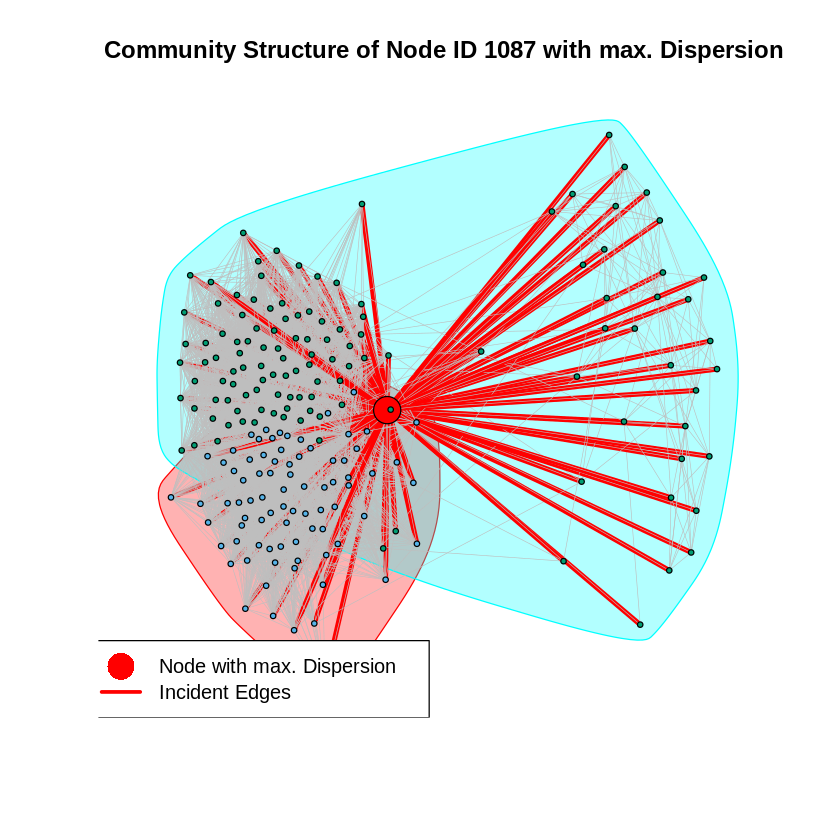

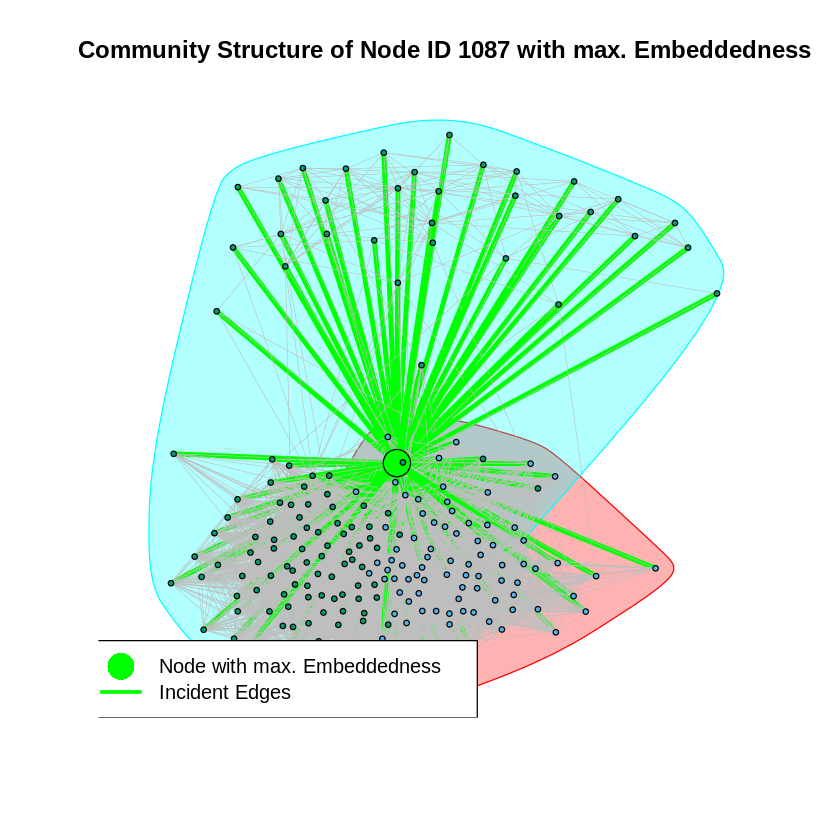

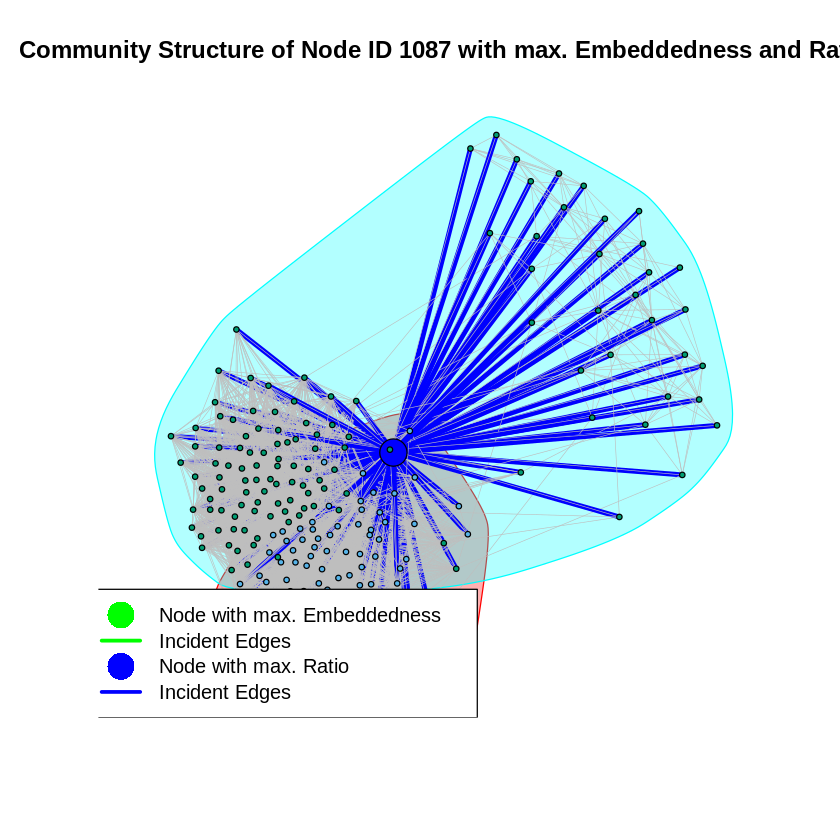

In [11]:
# Function to compute embeds and disp for a given core_id
compute_metrics <- function(g_core, core_id) {
  embeds <- numeric(length(V(g_core)))
  disp <- numeric(length(V(g_core)))

  for (i in seq_along(V(g_core))) {
    v <- V(g_core)$name[i]
    if (v == core_id) next

    core_neighbors <- neighbors(g_core, core_id)$name
    target_neighbors <- neighbors(g_core, v)$name
    inter <- intersect(core_neighbors, target_neighbors)
    embeds[i] <- length(inter)

    g_modified <- delete.vertices(g_core, c(core_id, v))
    if (embeds[i] > 1) {
      vtoids <- which(V(g_modified)$name %in% inter)
      disp_mat <- distances(g_modified, v = vtoids, to = vtoids)
      disp_mat[is.infinite(disp_mat)] <- NA
      disp[i] <- sum(disp_mat, na.rm = TRUE)
    } else {
      disp[i] <- NA
    }
  }
  list(embeds = embeds, disp = disp)
}


# Function to plot and highlight nodes based on metrics
plot_and_highlight <- function(g_core, fgc, metric_values, color, legend_labels) {
  vert_color <- fgc$membership + 1
  vert_color[metric_values$max_node] <- color
  vert_size <- rep(2, length(vert_color))
  vert_size[metric_values$max_node] <- 10

  edge_color <- rep("grey", length(E(g_core)))
  edge_color[which(get.edgelist(g_core, name = FALSE)[,1] == metric_values$max_node |
                    get.edgelist(g_core, name = FALSE)[,2] == metric_values$max_node)] <- color

  edge_wid <- rep(0.5, length(E(g_core)))
  edge_wid[which(get.edgelist(g_core, name = FALSE)[,1] == metric_values$max_node |
                  get.edgelist(g_core, name = FALSE)[,2] == metric_values$max_node)] <- 4

  plot(g_core, mark.groups = fgc, vertex.color = vert_color, vertex.size = vert_size,
       edge.color = edge_color, edge.width = edge_wid, vertex.label = NA,
       main = sprintf(legend_labels$title, as.numeric(core_id) + 1))

  legend('bottomleft', col = legend_labels$colors,
         lty = legend_labels$linetypes, lwd = legend_labels$linewidths,
         pch = legend_labels$points, pt.cex = 3, legend = legend_labels$legend_text)
}

# Main loop
fb_txt <- read.table('/content/facebook_combined.txt', header = FALSE)
g <- graph_from_data_frame(fb_txt, directed = FALSE)
core_ids <- c("0", "107", "348", "483", "1086")

for (core_id in core_ids) {
  neighbor_nodes <- unlist(ego(g, order = 1, nodes = core_id))
  g_core <- induced.subgraph(g, neighbor_nodes)
  g_core$name <- sort(neighbor_nodes)

  metrics <- compute_metrics(g_core, core_id)
  embeds <- metrics$embeds
  disp <- metrics$disp

  fgc <- cluster_fast_greedy(g_core)

  # Plot and highlight for max dispersion
  max_disp_node <- which.max(disp)
  plot_and_highlight(g_core, fgc, list(max_node = max_disp_node), "red",
                     list(colors = c("red", "red"), linetypes = c(0, 1),
                          linewidths = c(5, 3), points = c(16, NA),
                          legend_text = c("Node with max. Dispersion", "Incident Edges"),
                          title = "Community Structure of Node ID %d with max. Dispersion"))

  # Plot and highlight for max embeddedness
  max_embed_node <- which.max(embeds)
  plot_and_highlight(g_core, fgc, list(max_node = max_embed_node), "green",
                     list(colors = c("green", "green"), linetypes = c(0, 1),
                          linewidths = c(5, 3), points = c(16, NA),
                          legend_text = c("Node with max. Embeddedness", "Incident Edges"),
                          title = "Community Structure of Node ID %d with max. Embeddedness"))

  # Plot and highlight for max ratio
  max_ratio_node <- which.max(disp/embeds)
  plot_and_highlight(g_core, fgc, list(max_node = max_ratio_node), "blue",
                     list(colors = c("green", "green", "blue", "blue"),
                          linetypes = c(0, 1, 0, 1), linewidths = c(5, 3, 5, 3),
                          points = c(16, NA, 16, NA),
                          legend_text = c("Node with max. Embeddedness", "Incident Edges",
                                          "Node with max. Ratio", "Incident Edges"),
                          title = "Community Structure of Node ID %d with max. Embeddedness and Ratio"))
}


### Question 15 ###

Answer: Based on the project guidelines, "Dispersion" for a node is the sum of distances between all pairs of mutual vertices that the node shares with the core node. In contrast, "Embeddedness" represents the count of mutual friends a node has with the core node. Analyzing the plots reveals some interesting patterns. The node highlighted with maximum dispersion (in red) typically has a higher degree and tends to have neighbors further away. On the other hand, the node with maximum embeddedness (in green) is usually part of a larger community with more nodes and stronger connections within that community.

Furthermore, the highest ratio of $\frac{\text{Dispersion}}{\text{Embeddedness}}$ is found when dispersion is high but embeddedness is low. This suggests that the node likely has mutual friends across different communities with stronger connections. However, nodes with high dispersion but low embeddedness are rare. Thus, the node with the highest ratio often coincides with the node having both high dispersion and high embeddedness, as seen in the plots above.

### Question 16 ###

In [4]:
# Read the Facebook combined data
fb_combined <- read.table('/content/facebook_combined.txt',header=F)

# Convert to matrix and adjust for 1-based indexing
tmp_mat <- as.matrix(fb_combined) + 1

# Create the graph
g <- graph.edgelist(tmp_mat, directed = FALSE)

# Node ID
id <- "415"

# Create ego graph for the given node
g_415 <- make_ego_graph(g, order = 1, nodes = c(id))[[1]]

# Find nodes with degree 24 in the ego graph
Nr <- which(degree(g_415) == 24)

# Print the length of the list Nr
print(sprintf("The length of the list Nr: %d", length(Nr)))


Warning message:
“`graph.edgelist()` was deprecated in igraph 2.0.0.
ℹ Please use `graph_from_edgelist()` instead.”


[1] "The length of the list Nr: 11"


Answer: The length is 11

### Question 17 ###

In [9]:
# Function to compute neighborhood measures
neighborhood_measure <- function(graph, node_i, node_j, measure) {
  s_i <- neighbors(graph, node_i, mode = "all")
  s_j <- neighbors(graph, node_j, mode = "all")
  inter <- intersection(s_i, s_j)

  if (measure == "common") {
    return(length(inter))
  } else if (measure == "jaccard") {
    uni <- union(s_i, s_j)
    return(length(inter) / length(uni))
  } else if (measure == "adamic") {
    sum_val <- sum(1 / log(sapply(inter, function(k) {
      n_k <- neighbors(graph, k, mode = "all")
      if (length(n_k) == 0) return(1)
      return(length(n_k))
    })))
    return(sum_val)
  }
}

# Examples of usage:
# common.neighbors(g, node_i, node_j)
# jaccard(g, node_i, node_j)
# adamic.adar(g, node_i, node_j)


In [10]:
# Global variables
num_iterations <- 10
edge_removal_prob <- 0.25
neighborhood_measures <- c("common", "jaccard", "adamic")

for (measure_type in neighborhood_measures) {
  # Initialize
  overall_average_accuracy <- c()

  # Compute the average accuracy for each user i in the list Nr
  for (user_i in Nr) {
    # Initialize
    user_average_accuracy <- c()

    for (iteration in seq(num_iterations)) {
      # Randomly select edges to remove with probability edge_removal_prob
      user_i_edges <- incident(g_415, v=user_i, mode=c("all"))
      R_i <- sample(user_i_edges, edge_removal_prob * degree(g_415, v=user_i))
      g_415_remove <- delete_edges(g_415, R_i)

      # Convert to removed nodes only, not edge
      R_i_nodes <- as.vector(ends(g_415, R_i))
      R_i_nodes <- R_i_nodes[! R_i_nodes %in% c(user_i)]

      # Recommend |R_i| new friends to user_i
      results <- c()
      neighbors_i <- neighbors(g_415_remove, user_i)
      not_neighbors_i <- setdiff(V(g_415_remove), neighbors_i)
      not_neighbors_i <- not_neighbors_i[! not_neighbors_i %in% c(user_i)]

      for (user_j in not_neighbors_i) {
        if (measure_type == "common") {
          results <- c(results, common.neighbors(g_415_remove, user_i, user_j))
        } else if (measure_type == "jaccard") {
          results <- c(results, jaccard(g_415_remove, user_i, user_j))
        } else if(measure_type == "adamic") {
          results <- c(results, adamic.adar(g_415_remove, user_i, user_j))
        }
      }

      results_sorted <- sort(results, decreasing=T, index.return=T)
      recommended_friends <- not_neighbors_i[results_sorted$ix][c(1:length(R_i_nodes))]

      # Store the accuracy
      user_average_accuracy <- c(user_average_accuracy, length(intersect(recommended_friends, R_i_nodes)) / length(R_i_nodes))
    }

    # Average accuracy for user i in the list Nr
    user_average_accuracy <- mean(user_average_accuracy)
    overall_average_accuracy <- c(overall_average_accuracy, user_average_accuracy)
  }

  # Compute mean accuracy
  overall_average_accuracy <- mean(overall_average_accuracy)

  # Report
  if (measure_type == "common") {
    print(sprintf("The average accuracy based on Common Neighbor: %f", overall_average_accuracy))
  } else if (measure_type == "jaccard") {
    print(sprintf("The average accuracy based on Jaccard: %f", overall_average_accuracy))
  } else if(measure_type == "adamic") {
    print(sprintf("The average accuracy based on Adamic-Adar: %f", overall_average_accuracy))
  }
}


[1] "The average accuracy based on Common Neighbor: 0.831818"
[1] "The average accuracy based on Jaccard: 0.812121"
[1] "The average accuracy based on Adamic-Adar: 0.828788"
